In [1]:
import geopandas as gpd
import contextily as cx
import warnings
import pandas as pd
import math
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
import os
import sys
sys.path[0] = os.path.join(os.path.abspath(''),'..')
import data_pipeline.spatial_operations as so
from shapely.geometry import Polygon, MultiPolygon

In [2]:
FIPS_CODES = {"ALABAMA": "01", "ALASKA": "02", "ARIZONA": "04", "ARKANSAS": "05", "CALIFORNIA": "06", 
              "COLORADO": "08", "CONNECTICUT": "09", "DELAWARE": "10", "DISTRICT OF COLUMBIA": "11", 
              "FLORIDA": "12", "GEORGIA": "13", "HAWAII": "15", "IDAHO": "16", "ILLINOIS": "17", "INDIANA": "18", 
              "IOWA": "19", "KANSAS": "20", "KENTUCKY": "21", "LOUISIANA": "22", "MAINE": "23", "MARYLAND": "24", 
              "MASSACHUSETTS": "25", "MICHIGAN": "26", "MINNESOTA": "27", "MISSISSIPPI": "28", "MISSOURI": "29", 
              "MONTANA": "30", "NEBRASKA": "31", "NEVADA": "32", "NEW HAMPSHIRE": "33", "NEW JERSEY": "34", 
              "NEW MEXICO": "35", "NEW YORK": "36", "NORTH CAROLINA": "37", "NORTH DAKOTA": "38", "OHIO": "39", 
              "OKLAHOMA": "40", "OREGON": "41", "PENNSYLVANIA": "42", "PUERTO RICO": "72", "RHODE ISLAND": "44", 
              "SOUTH CAROLINA": "45", "SOUTH DAKOTA": "46", "TENNESSEE": "47", "TEXAS": "48", "UTAH": "49", 
              "VERMONT": "50", "VIRGINIA": "51", "VIRGIN ISLANDS": "78", "WASHINGTON": "53", "WEST VIRGINIA": "54", 
              "WISCONSIN": "55", "WYOMING": "56", "AL": "01", "AK": "02", "AZ": "04", "AR": "05", "CA": "06", 
              "CO": "08", "CT": "09", "DE": "10", "DC": "11", "FL": "12", "GA": "13", "HI": "15", "ID": "16", 
              "IL": "17", "IN": "18", "IA": "19", "KS": "20", "KY": "21", "LA": "22", "ME": "23", "MD": "24", 
              "MA": "25", "MI": "26", "MN": "27", "MS": "28", "MO": "29", "MT": "30", "NE": "31", "NV": "32", 
              "NH": "33", "NJ": "34", "NM": "35", "NY": "36", "NC": "37", "ND": "38", "OH": "39", "OK": "40", 
              "OR": "41", "PA": "42", "PR": "72", "RI": "44", "SC": "45", "SD": "46", "TN": "47", "TX": "48", 
              "UT": "49", "VT": "50", "VA": "51", "VI": "78", "WA": "53", "WV": "54", "WI": "55", "WY": "56"}

In [3]:
def thresholds(city, id_col, percent_thresholds, state=None, map=True):
    return_list = []
    
    if state:
        code = FIPS_CODES[state.upper()]
        tracts = fcc_df[fcc_df.geoid.str.startswith(code)]
    else:
        tracts = fcc_df
    
    transformed = city.to_crs(epsg=4326, inplace=False)
    results = {"Unique neighborhoods before": len(np.unique(transformed[id_col]))}
    
    dissolved = transformed.dissolve()
    clipped = tracts.clip(dissolved)
    results["Unique tracts before"] = len(np.unique(clipped['geoid']))
    results["Neighborhood area"] = np.round(dissolved.to_crs(epsg=5070).area.array[0]/10e6, 4)

    merged = gpd.sjoin(tracts, transformed, how="inner", op='intersects')    
    overlay = tracts.overlay(transformed)
    overlay["overlap_area"] = overlay.to_crs(epsg=5070).area/10e6
    merged = merged.merge(overlay[['geoid', id_col, 'overlap_area']])
    merged["percent_area"] = merged["overlap_area"]/merged["total_area"]*100
    
    for p_t in percent_thresholds:
        filtered = merged[merged.percent_area >= p_t]
        results["Unique neighborhoods after"] = len(np.unique(filtered[id_col]))
        results["Unique tracts after"] = len(np.unique(filtered['geoid']))
        results["Total tracts after"] = len(filtered)
        results["Filtered area"] = np.round(np.sum(filtered.overlap_area), 4)
        results["Area loss"] = np.round((results["Neighborhood area"] - results["Filtered area"])/results["Neighborhood area"]*100, 4)
        results["Tract loss"] = results["Unique tracts before"] - results["Unique tracts after"]
        results["Neighborhood loss"] = results["Unique neighborhoods before"] - results["Unique neighborhoods after"]
        
        print('Threshold: ', p_t)
        for key, value in results.items():
            print(key.rjust(27, ' ') + ":", value)
        if results["Unique neighborhoods after"] == 0:
            print('Missing neighborhoods: all')
        else:
            print('Missing neighborhoods: ', np.setdiff1d(np.unique(city[id_col]), np.unique(filtered[id_col])), '\n')
        
        if map:
            f, ax = plt.subplots(figsize=(12, 12))
            filtered.drop_duplicates(subset='geometry').plot(ax=ax, color='lightcoral', alpha=0.4, edgecolor='k')
            dissolved.plot(ax=ax, color='lightblue', alpha=0.4, edgecolor='grey')
            tract_color = mpatches.Patch(facecolor='lightcoral', alpha=0.4, label='Tracts', edgecolor='k')
            nbhd_color = mpatches.Patch(facecolor='lightblue', alpha=0.4, label='Neighborhoods', edgecolor='grey')
            overlap_color = mpatches.Patch(color='#ceacb3', alpha=0.64, label='Overlap')
            ax.legend(handles=[tract_color, nbhd_color, overlap_color], title=f'Threshold {p_t}%', loc='upper left', frameon=False)
        
        return_list.append([p_t,
                            (f'{results["Neighborhood loss"]}/{results["Unique neighborhoods before"]}',
                            f'{results["Tract loss"]}/{results["Unique tracts before"]}',
                            results["Area loss"])])
    return return_list
        

In [4]:
def remove_overlaps(city_df, id_col, threshold=1e-4, print_info=False):
    intersected = city_df.overlay(city_df, how='intersection').query(f'{id_col}_1 != {id_col}_2')
    return_df = city_df.copy()
    for i, r in intersected.iterrows():
        nh_1_name = r[f'{id_col}_1']
        nh_1 = city_df[city_df[id_col] == nh_1_name]
        nh_2_name = r[f'{id_col}_2']
        nh_2 = city_df[city_df[id_col] == nh_2_name]
        overlap_ar = r.geometry.area
        nh_1_ar = nh_1.area.item()
        nh_2_ar = nh_2.area.item()
        nh_1_pct = overlap_ar/nh_1_ar
        nh_2_pct = overlap_ar/nh_2_ar
        if print_info:
            print(f'    Row {i}: {nh_1_name} & {nh_2_name}\n    {nh_1_pct} & {nh_2_pct}')            
        if nh_1_pct > threshold or nh_2_pct > threshold:
            print(f'Overlap in {nh_1_name} and {nh_2_name}: larger than {threshold*100}%')
        elif nh_1_pct > nh_2_pct:
            return_df.loc[return_df[id_col] == nh_2_name] = return_df.loc[return_df[id_col] == nh_2_name].set_geometry(
                return_df.loc[return_df[id_col] == nh_2_name].geometry - r.geometry)
        else:
            return_df.loc[return_df[id_col] == nh_1_name] = return_df.loc[return_df[id_col] == nh_1_name].set_geometry(
                return_df.loc[return_df[id_col] == nh_1_name].geometry - r.geometry)
    return return_df
            
            

In [5]:
def read_wrapper(city, file_path):
    file = gpd.read_file(file_path)
    print(city, '\n', file.head(2), '\n')
    return file

def check_overlaps(file, city, col):
    self_overlay = file.overlay(file)
    n_overlaps = len(self_overlay[self_overlay[col+'_1'] != self_overlay[col+'_2']])//2
    if n_overlaps > 0:
        print(f'Warning: {city} has {n_overlaps} overlaps.')
    else:
        print(f'         {city} has no overlaps.')
        
def threshold_wrapper(city, results, threshold_list):
    print(city[1])
    results[city[1]] = thresholds(city[0], city[2], threshold_list, state=city[3])

In [6]:
# fcc_df = read_wrapper("Tracts", "../internet-access-map/data/broadband.geojson")
fcc_df = gpd.read_file("../internet-access-map/data/broadband.geojson")

In [7]:
fcc_df['total_area'] = fcc_df['geometry'].to_crs(epsg=5070).area/10e6

In [8]:
# austin = read_wrapper('Austin', "../neighborhood-data/austin/Neighborhoods/geo_export_81d98617-c469-49e1-9bf6-3ef25c07d0c6.shp")
# baltimore = read_wrapper('Baltimore', "../neighborhood-data/baltimore/neighborhoods/baltimore.shp")
# boston = read_wrapper('Boston', "../neighborhood-data/boston/Boston_Neighborhoods/Boston_Neighborhoods.shp")
# dallas = read_wrapper('Dallas', "../neighborhood-data/dallas/Councils/Councils.shp")
# denver = read_wrapper('Denver', "../neighborhood-data/denver/denver_1.0.32/statistical_neighborhoods.shp")
# detroit = read_wrapper('Detroit', "../neighborhood-data/detroit/neighborhoods/detroit.shp")
# houston = read_wrapper('Houston', "../neighborhood-data/houston/Houston/Houston.shp")
# indianapolis = read_wrapper('Indianapolis', "../neighborhood-data/indianapolis/Indy_Neighborhoods/Indy_Neighborhoods.shp")
# losangeles = read_wrapper('Los Angeles', "../neighborhood-data/los-angeles/Los Angeles/Los Angeles.shp")
# louisville = read_wrapper('Louisville', "../neighborhood-data/louisville/neighborhoods/louisville.shp")
# phoenix = read_wrapper('Phoenix', "../neighborhood-data/phoenix/phoenix/Villages.shp")
# portland = read_wrapper('Portland', "../neighborhood-data/portland/portland-neighborhood-boundaries/Neighborhood_Boundaries.shp")
# sandiego = read_wrapper('San Diego', "../neighborhood-data/san-diego/CommunityPlanningAreas/cmty_plan_datasd.shp")
# sanfrancisco = read_wrapper('San Francisco', "../neighborhood-data/san-francisco/SF Find Neighborhoods/geo_export_f62da660-837f-478c-9ba4-ceb40e9ed8eb.shp")
# sanjose = read_wrapper('San Jose', "../neighborhood-data/san-jose/Zip_Code_Boundary/Zip_Code_Boundary.shp")
# seattle = read_wrapper('Seattle', "../neighborhood-data/seattle/seattle_ccn/City_Clerk_Neighborhoods.shp")
# washingtondc = read_wrapper('Washington DC', "../neighborhood-data/washington-dc/DC_shapefile/Neighborhood_Clusters.shp")

In [9]:
austin = gpd.read_file("../neighborhood-data/austin/Neighborhoods/geo_export_81d98617-c469-49e1-9bf6-3ef25c07d0c6.shp")
baltimore = gpd.read_file("../neighborhood-data/baltimore/neighborhoods/baltimore.shp")
boston = gpd.read_file("../neighborhood-data/boston/Boston_Neighborhoods/Boston_Neighborhoods.shp")
dallas = gpd.read_file("../neighborhood-data/dallas/Councils/Councils.shp")
denver = gpd.read_file("../neighborhood-data/denver/denver_1.0.32/statistical_neighborhoods.shp")
detroit = gpd.read_file("../neighborhood-data/detroit/neighborhoods/detroit.shp")
houston = gpd.read_file("../neighborhood-data/houston/Houston/Houston.shp")
indianapolis = gpd.read_file("../neighborhood-data/indianapolis/Indy_Neighborhoods/Indy_Neighborhoods.shp")
losangeles = gpd.read_file("../neighborhood-data/los-angeles/Los Angeles/Los Angeles.shp")
louisville = gpd.read_file("../neighborhood-data/louisville/neighborhoods/louisville.shp")
phoenix = gpd.read_file("../neighborhood-data/phoenix/phoenix/Villages.shp")
portland = gpd.read_file("../neighborhood-data/portland/portland-neighborhood-boundaries/Neighborhood_Boundaries.shp")
sandiego = gpd.read_file("../neighborhood-data/san-diego/CommunityPlanningAreas/cmty_plan_datasd.shp")
sanfrancisco = gpd.read_file("../neighborhood-data/san-francisco/SF Find Neighborhoods/geo_export_f62da660-837f-478c-9ba4-ceb40e9ed8eb.shp")
sanjose = gpd.read_file("../neighborhood-data/san-jose/Zip_Code_Boundary/Zip_Code_Boundary.shp")
seattle = gpd.read_file("../neighborhood-data/seattle/seattle_ccn/City_Clerk_Neighborhoods.shp")
washingtondc = gpd.read_file("../neighborhood-data/washington-dc/DC_shapefile/Neighborhood_Clusters.shp")

In [10]:
city_list = [[austin, 'Austin', 'neighname', 'tx'], [baltimore, 'Baltimore', 'Name', 'md'], 
             [boston, 'Boston', 'Name', 'ma'], [dallas, 'Dallas', 'COUNCIL', 'tx'], 
             [denver, 'Denver', 'NBHD_NAME', 'co'], [detroit, 'Detroit', 'name', 'mi'], 
             [houston, 'Houston', 'SNBNAME', 'tx'], [indianapolis, 'Indianapolis', 'NAME', 'in'], 
             [losangeles, 'Los Angeles', 'display_na', 'ca'], [louisville, 'Louisville', 'OBJECTID', 'ky'], 
             [phoenix, 'Phoenix', 'NAME', 'az'], [portland, 'Portland', 'OBJECTID', 'or'], 
             [sandiego, 'San Diego', 'cpname', 'ca'], [sanfrancisco, 'San Francisco', 'name', 'ca'], 
             [sanjose, 'San Jose', 'ZIPCODE', 'ca'], [seattle, 'Seattle', 'HOODS_', 'wa'], 
             [washingtondc, 'Washington DC', 'NBH_NAMES', 'dc']]

In [12]:
for city in city_list:
    print("Before:")
    check_overlaps(city[0], city[1], city[2])
    if city[1] == 'Los Angeles' or city[1] == 'San Francisco':
        print("Skipping")
        continue
    if city[1] == 'Detroit':
        new_gdf = remove_overlaps(city[0], city[2], threshold=.0055)
    else:
        new_gdf = remove_overlaps(city[0], city[2])
    city[0] = new_gdf
    print("After:")
    check_overlaps(city[0], city[1], city[2])
    print('')

Before:
After:

Before:
After:

Before:
         Boston has no overlaps.
After:
         Boston has no overlaps.

Before:
         Dallas has no overlaps.
After:
         Dallas has no overlaps.

Before:
         Denver has no overlaps.
After:
         Denver has no overlaps.

Before:
After:
         Detroit has no overlaps.

Before:
After:

Before:
         Indianapolis has no overlaps.
After:
         Indianapolis has no overlaps.

Before:
Skipping
Before:
         Louisville has no overlaps.
After:
         Louisville has no overlaps.

Before:
         Phoenix has no overlaps.
After:
         Phoenix has no overlaps.

Before:
After:
         Portland has no overlaps.

Before:
After:

Before:
Skipping
Before:
After:

Before:
         Seattle has no overlaps.
After:
         Seattle has no overlaps.

Before:
         Washington DC has no overlaps.
After:
         Washington DC has no overlaps.



# SHP Overlap Summary

* Austin: 8 vs 36
* Baltimore: 2 vs 25
* Boston: 0 vs 2
* Dallas: --
* Denver: 0 vs 2
* Detroit: 3 vs 51
* Houston: 2 vs 7
* Indianapolis: 0 vs 2
* Louisville: --
* Phoenix: 0 vs 1
* Portland: 1 vs 12
* San Diego: 4 vs 7
* San Jose: 1 vs 51
* Seattle: --
* Washington DC: --

(-- means had none to begin with)

__\*\*\* LA (586) and San Francisco (192) were having problems, need to investigate more. \*\*\*__

In [13]:
rancho_penasquitos = city_list[12][0].iloc[43].explode()
rancho_poly = rancho_penasquitos.geometry[1]
new_sd = city_list[12][0]
new_sd.loc[new_sd.objectid == 44] = new_sd.loc[new_sd.objectid == 44].set_geometry(gpd.GeoSeries(rancho_poly).values)


In [14]:
city_results = {'Key': ['Threshold', ('Lost Nbhd/Total', 'Lost Tract/Total', '% Area Loss')]}
threshold_list = [0, .05, .1, .5, 1, 2, 5]

Austin
Threshold:  0
Unique neighborhoods before: 103
       Unique tracts before: 222
          Neighborhood area: 80.779
 Unique neighborhoods after: 103
        Unique tracts after: 222
         Total tracts after: 737
              Filtered area: 80.779
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 103
       Unique tracts before: 222
          Neighborhood area: 80.779
 Unique neighborhoods after: 103
        Unique tracts after: 220
         Total tracts after: 599
              Filtered area: 80.7654
                  Area loss: 0.0168
                 Tract loss: 2
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 103
       Unique tracts before: 222
          Neighborhood area: 80.779
 Unique neighborhoods after: 103
        Unique tracts after: 219
         Total tracts after: 549
              Filte

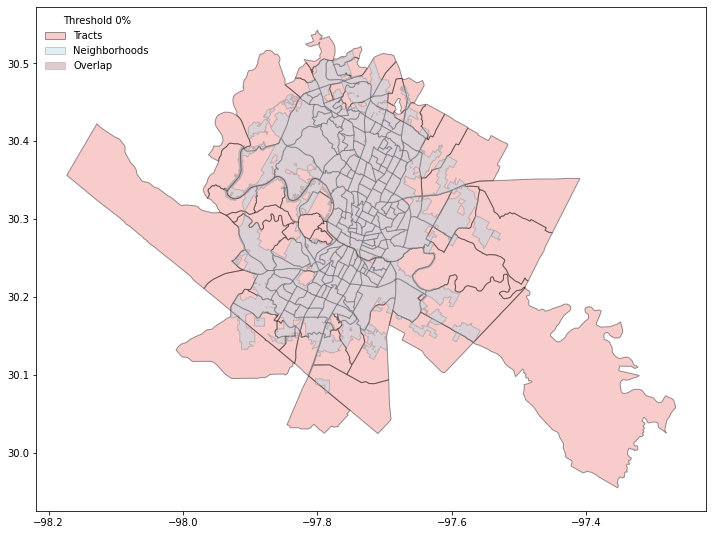

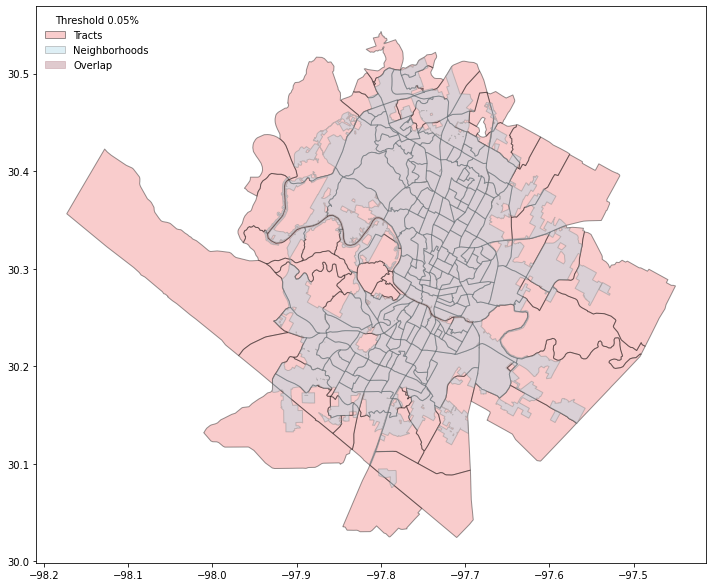

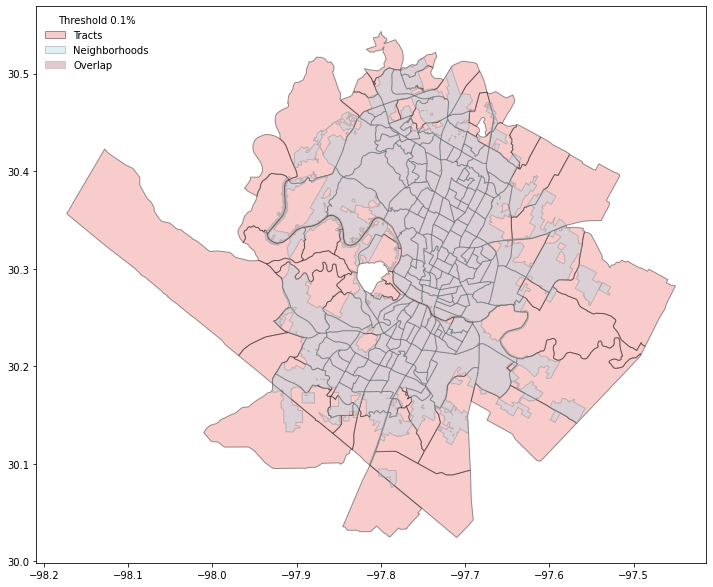

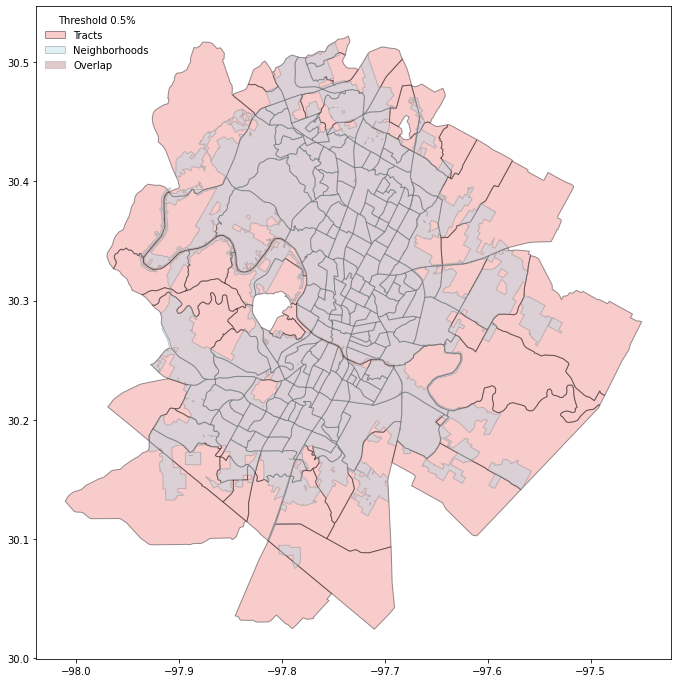

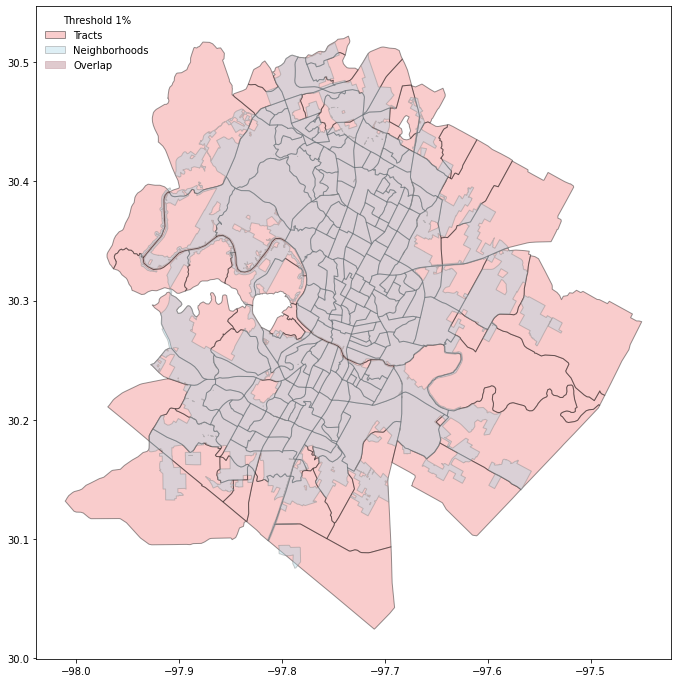

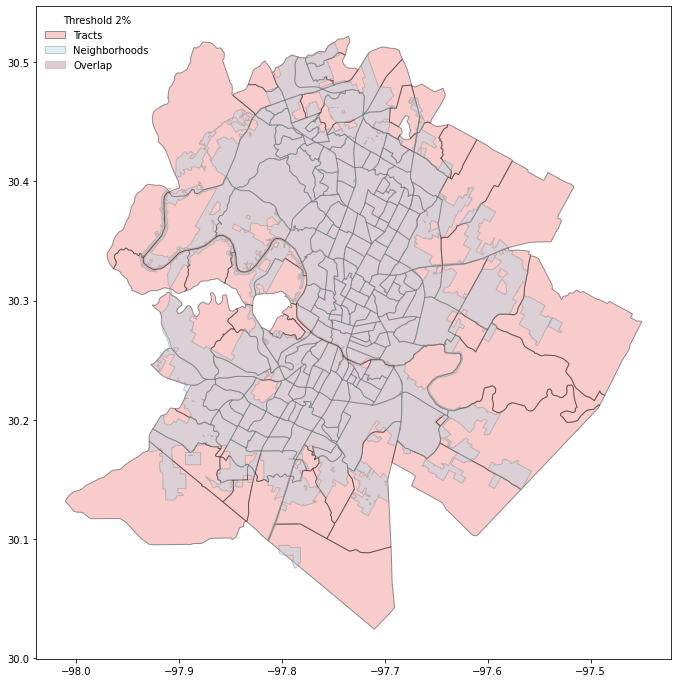

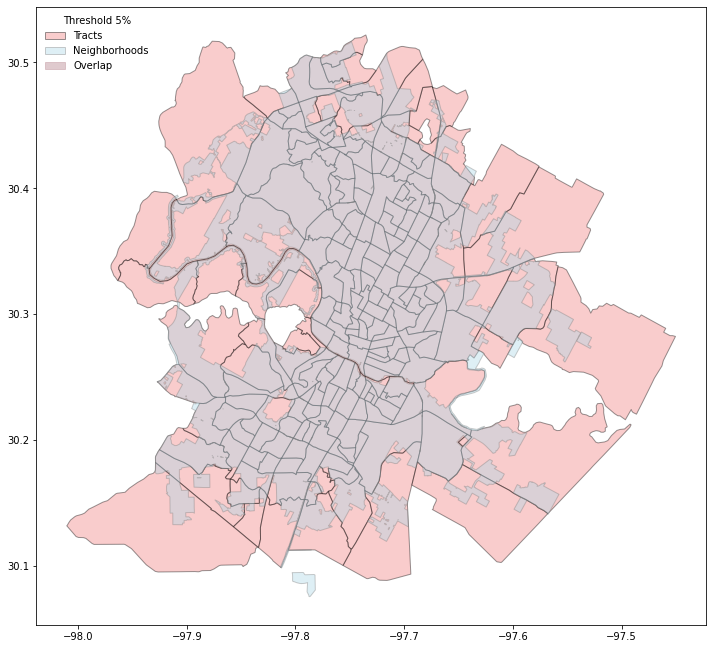

In [15]:
threshold_wrapper(city_list[0], city_results, threshold_list)

Baltimore
Threshold:  0
Unique neighborhoods before: 278
       Unique tracts before: 231
          Neighborhood area: 21.0355
 Unique neighborhoods after: 278
        Unique tracts after: 231
         Total tracts after: 1199
              Filtered area: 21.0285
                  Area loss: 0.0333
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 278
       Unique tracts before: 231
          Neighborhood area: 21.0355
 Unique neighborhoods after: 278
        Unique tracts after: 221
         Total tracts after: 931
              Filtered area: 21.022
                  Area loss: 0.0642
                 Tract loss: 10
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 278
       Unique tracts before: 231
          Neighborhood area: 21.0355
 Unique neighborhoods after: 278
        Unique tracts after: 217
         Total tracts after: 862
        

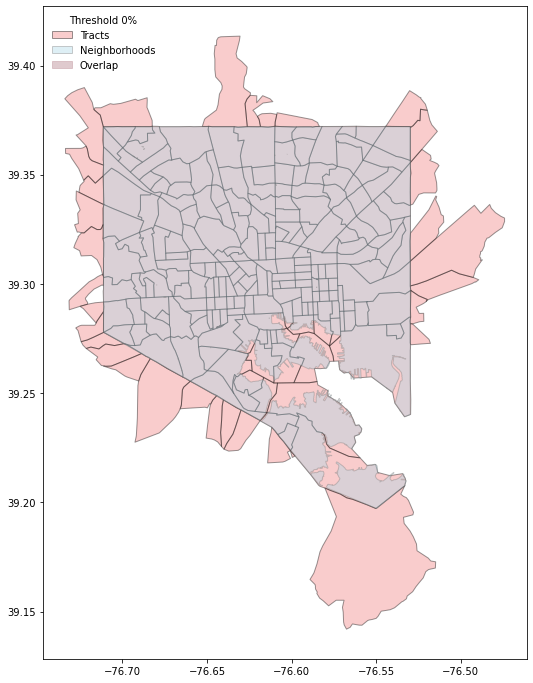

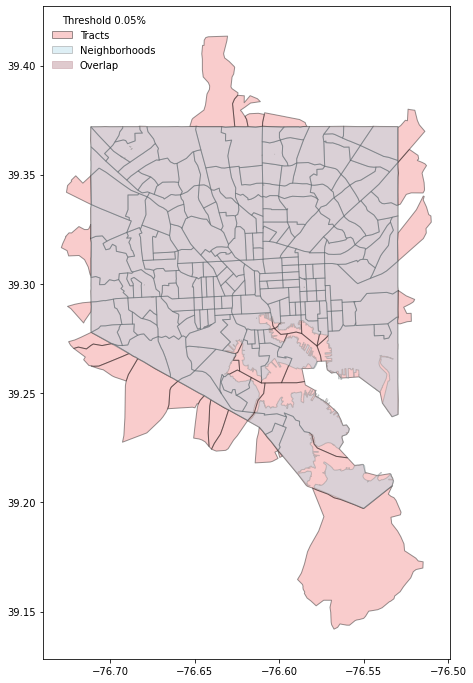

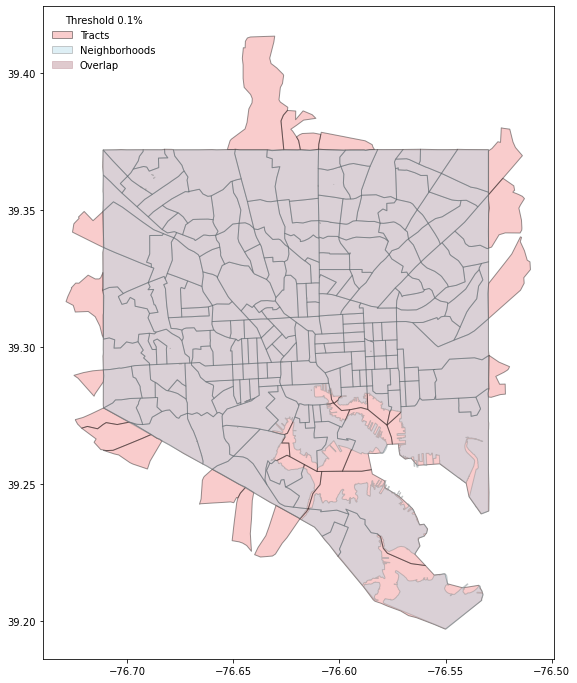

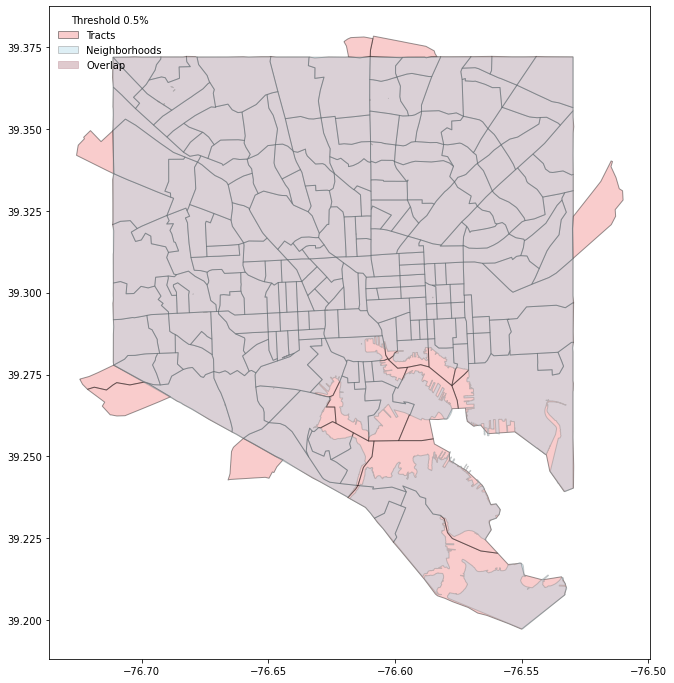

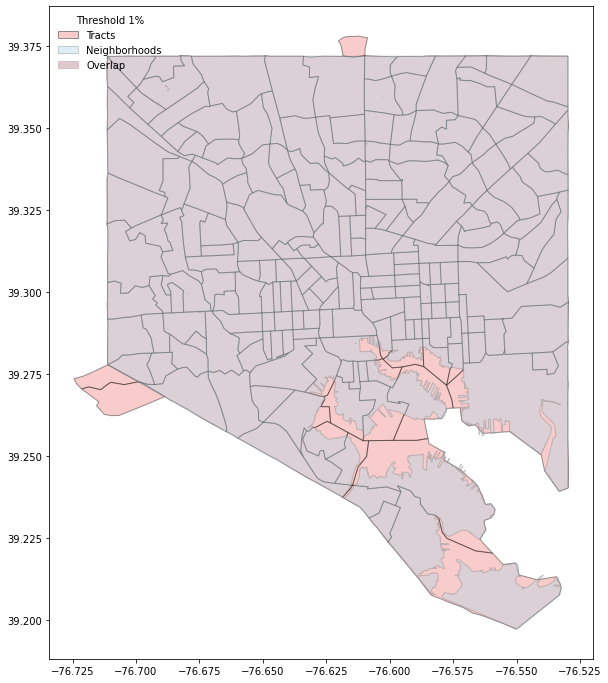

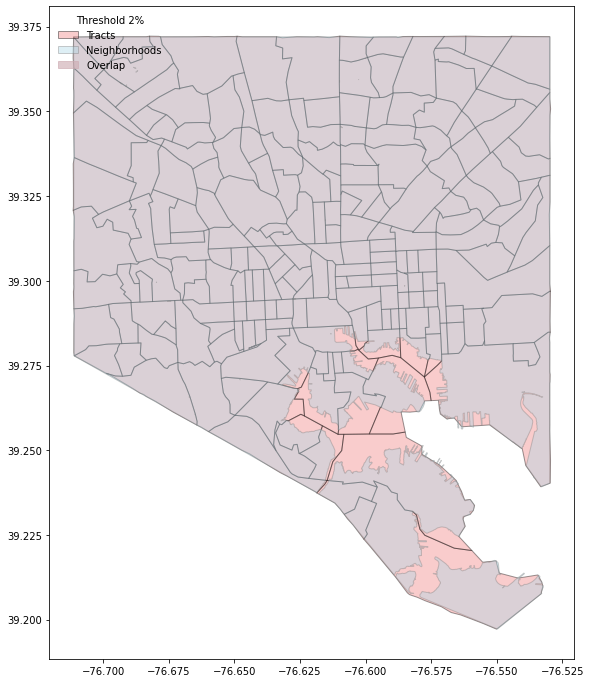

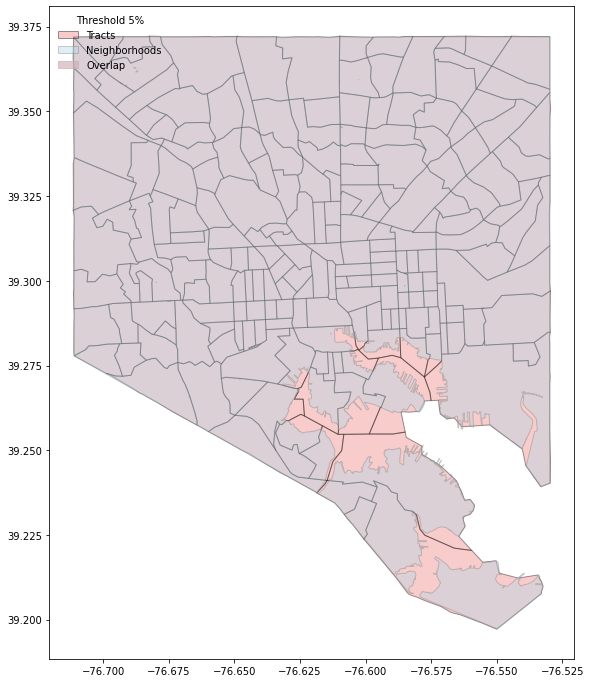

In [16]:
threshold_wrapper(city_list[1], city_results, threshold_list)

Boston
Threshold:  0
Unique neighborhoods before: 26
       Unique tracts before: 213
          Neighborhood area: 12.6714
 Unique neighborhoods after: 26
        Unique tracts after: 213
         Total tracts after: 370
              Filtered area: 12.654
                  Area loss: 0.1373
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 26
       Unique tracts before: 213
          Neighborhood area: 12.6714
 Unique neighborhoods after: 26
        Unique tracts after: 197
         Total tracts after: 316
              Filtered area: 12.6528
                  Area loss: 0.1468
                 Tract loss: 16
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 26
       Unique tracts before: 213
          Neighborhood area: 12.6714
 Unique neighborhoods after: 26
        Unique tracts after: 196
         Total tracts after: 305
              Filt

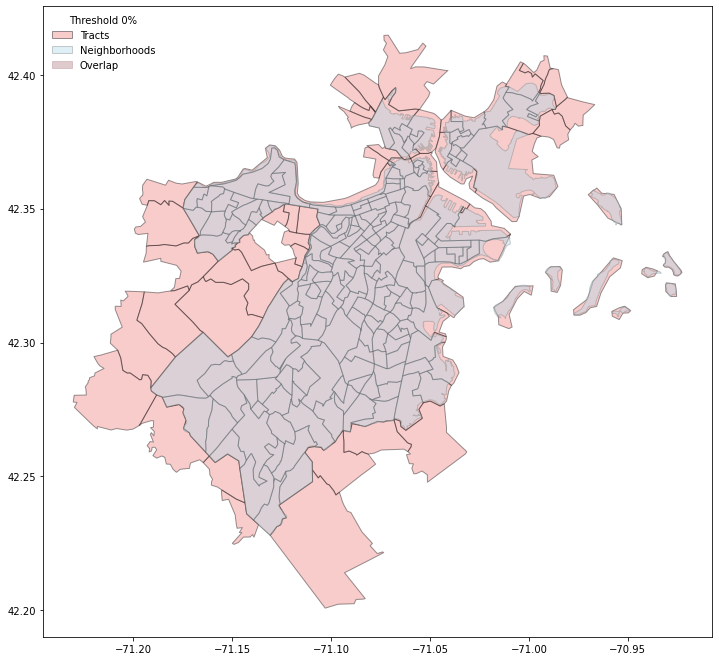

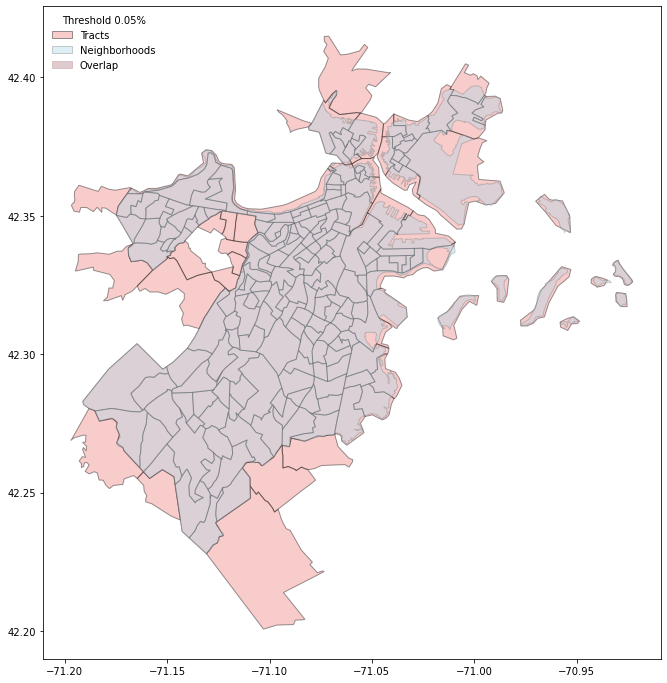

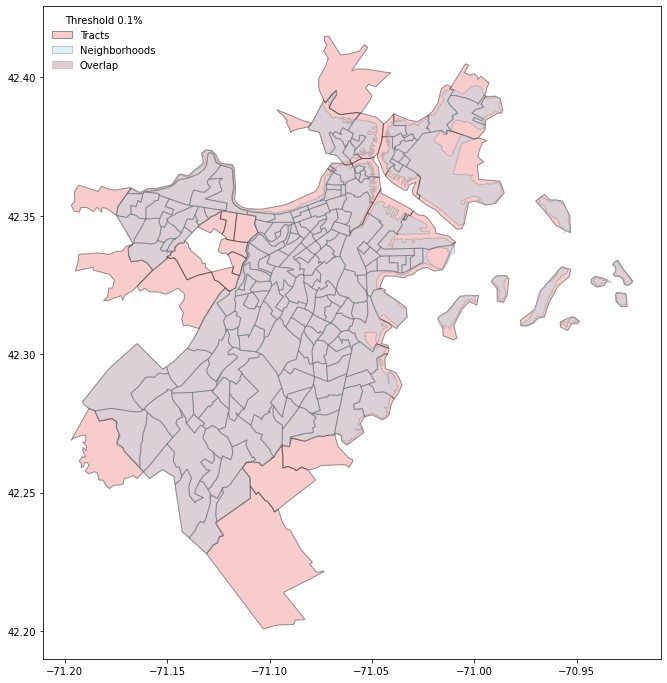

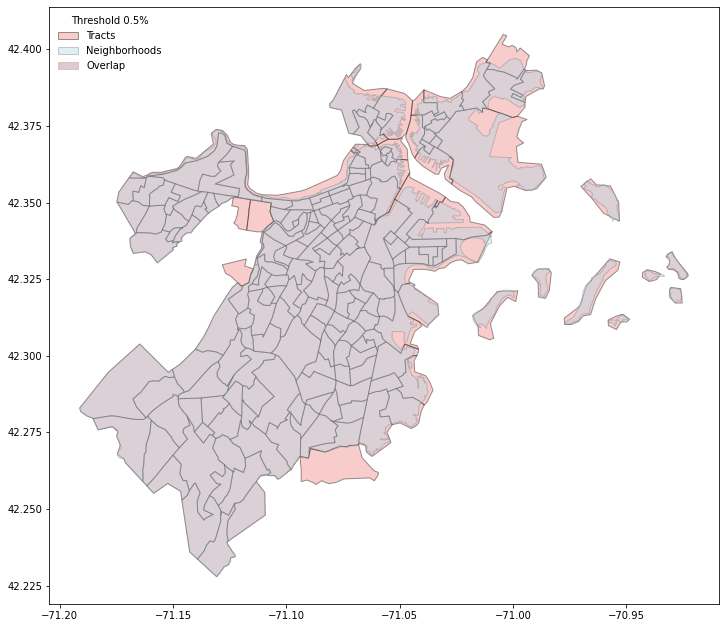

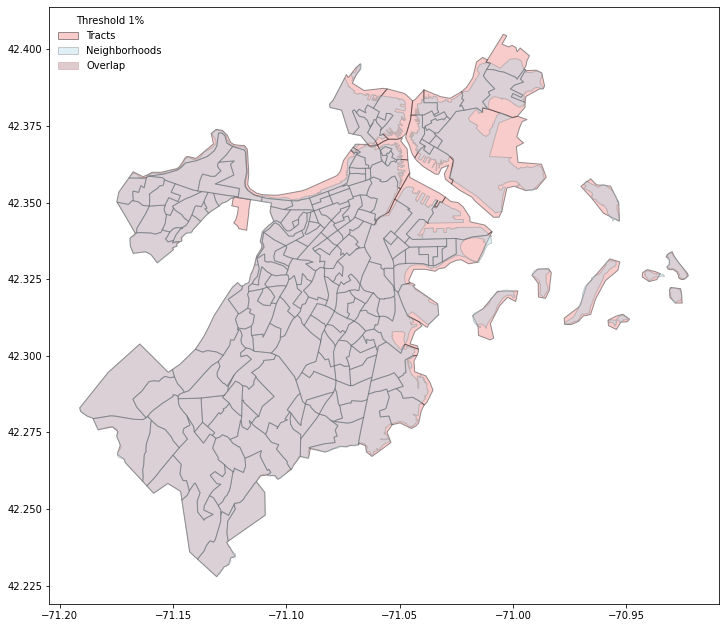

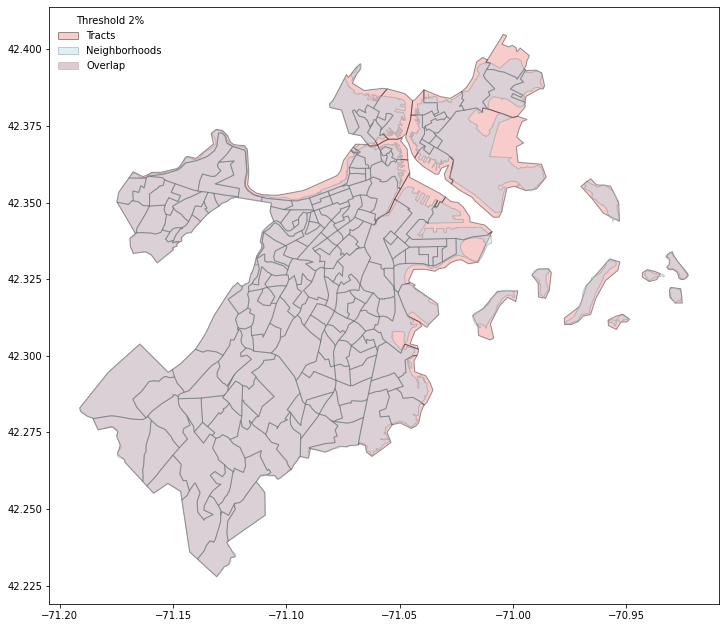

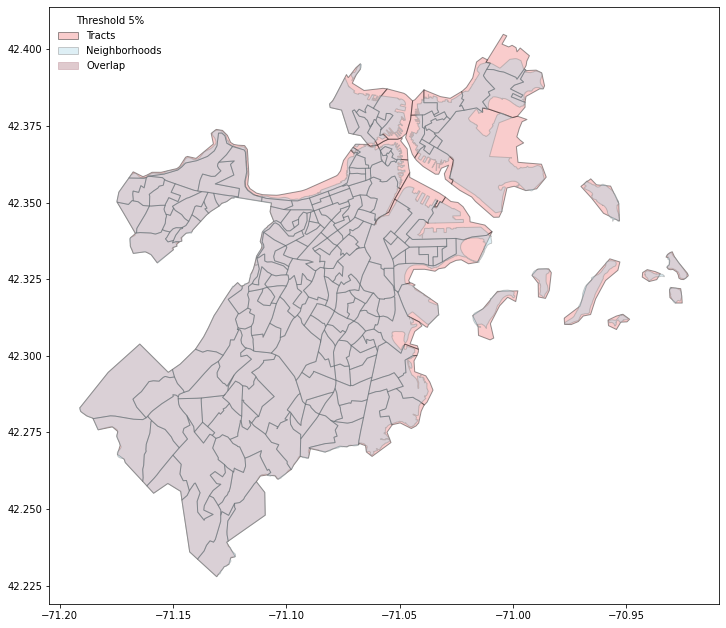

In [17]:
threshold_wrapper(city_list[2], city_results, threshold_list)

Dallas
Threshold:  0
Unique neighborhoods before: 14
       Unique tracts before: 383
          Neighborhood area: 99.3632
 Unique neighborhoods after: 14
        Unique tracts after: 383
         Total tracts after: 600
              Filtered area: 99.3632
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 14
       Unique tracts before: 383
          Neighborhood area: 99.3632
 Unique neighborhoods after: 14
        Unique tracts after: 378
         Total tracts after: 537
              Filtered area: 99.3607
                  Area loss: 0.0025
                 Tract loss: 5
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 14
       Unique tracts before: 383
          Neighborhood area: 99.3632
 Unique neighborhoods after: 14
        Unique tracts after: 375
         Total tracts after: 515
              Filtere

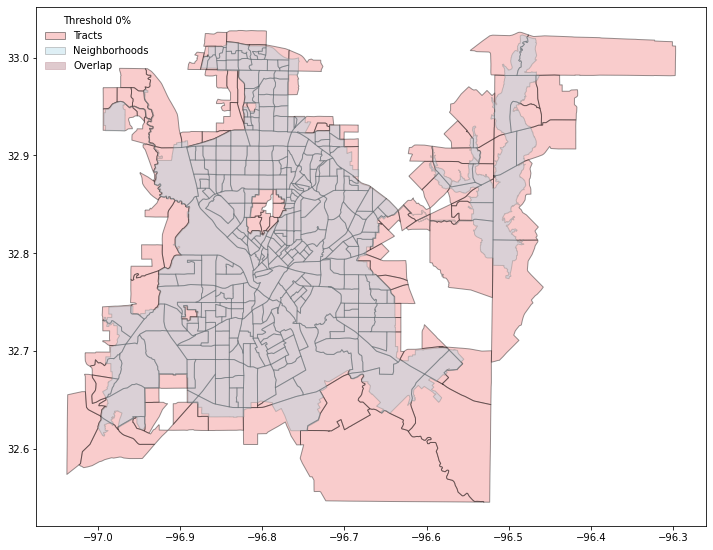

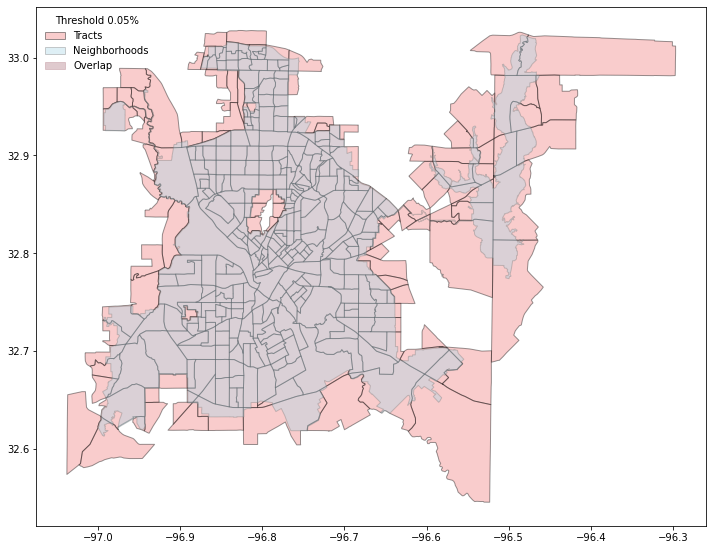

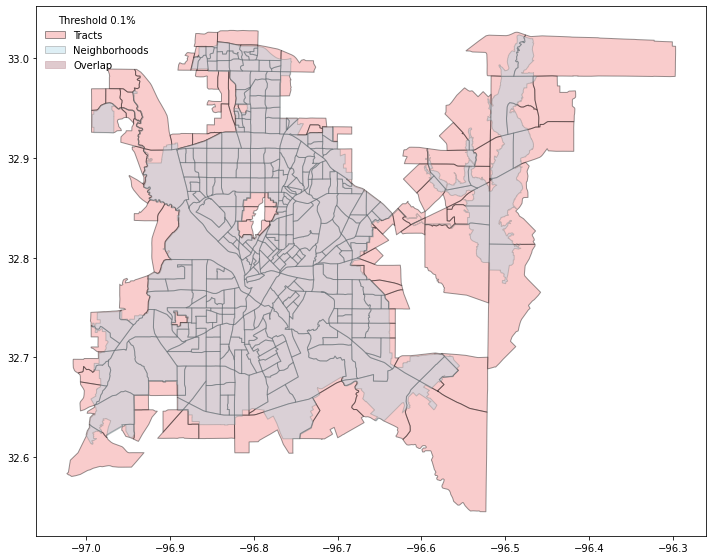

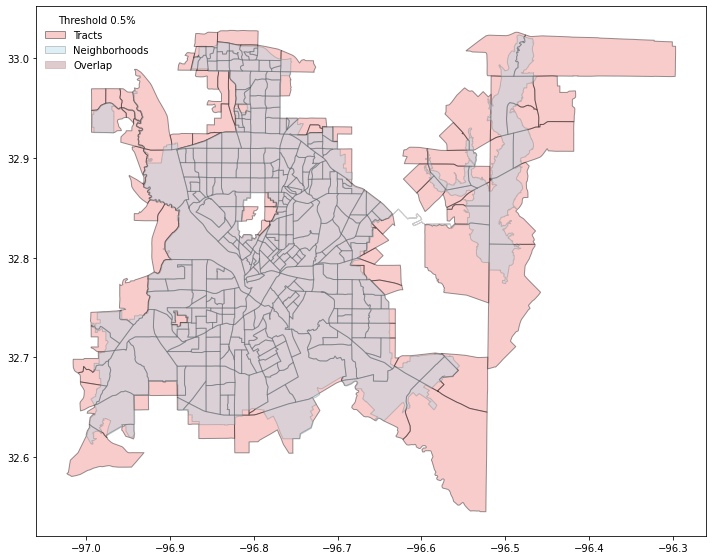

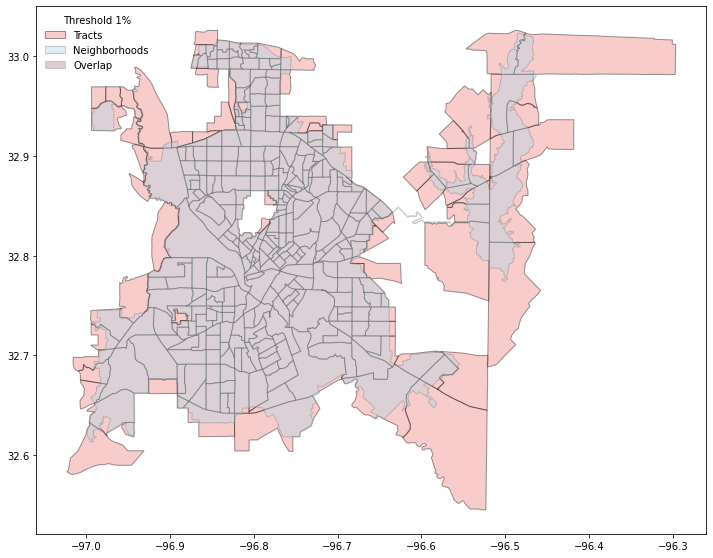

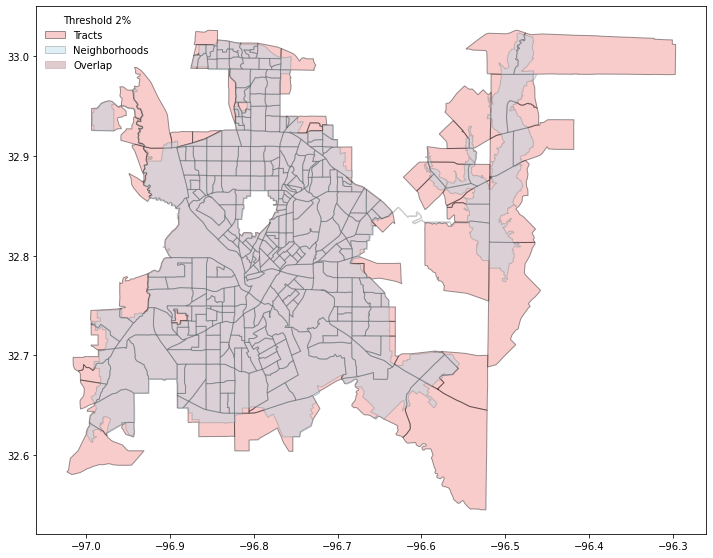

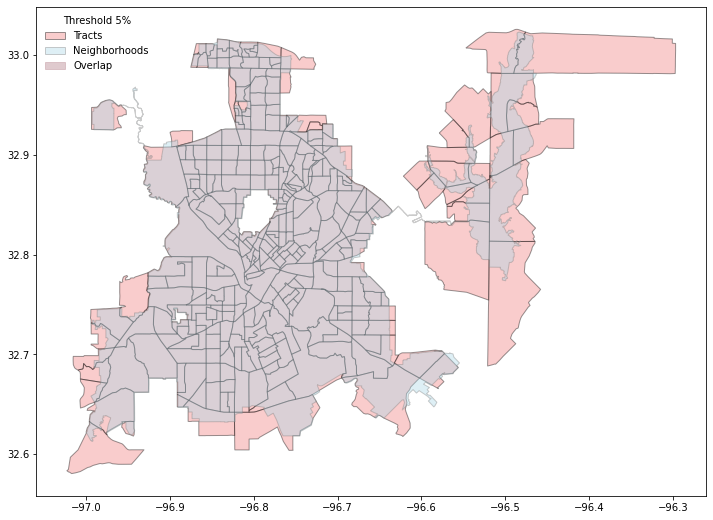

In [18]:
threshold_wrapper(city_list[3], city_results, threshold_list)

Denver
Threshold:  0
Unique neighborhoods before: 78
       Unique tracts before: 203
          Neighborhood area: 40.0792
 Unique neighborhoods after: 78
        Unique tracts after: 203
         Total tracts after: 654
              Filtered area: 40.0797
                  Area loss: -0.0012
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 78
       Unique tracts before: 203
          Neighborhood area: 40.0792
 Unique neighborhoods after: 78
        Unique tracts after: 186
         Total tracts after: 327
              Filtered area: 40.0678
                  Area loss: 0.0284
                 Tract loss: 17
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 78
       Unique tracts before: 203
          Neighborhood area: 40.0792
 Unique neighborhoods after: 78
        Unique tracts after: 178
         Total tracts after: 287
              Fi

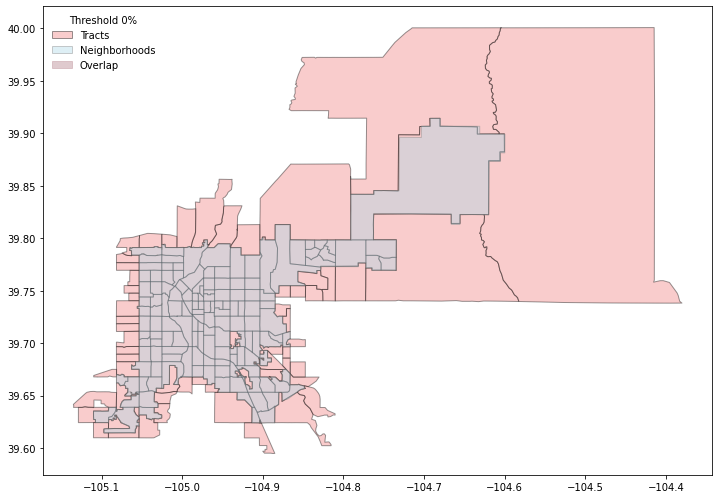

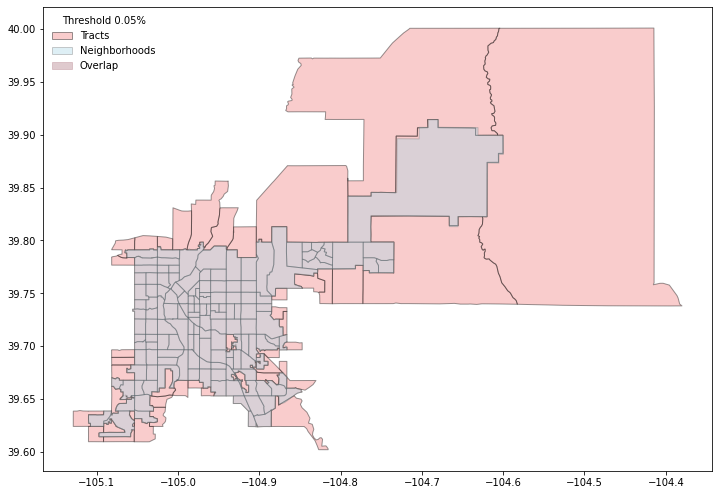

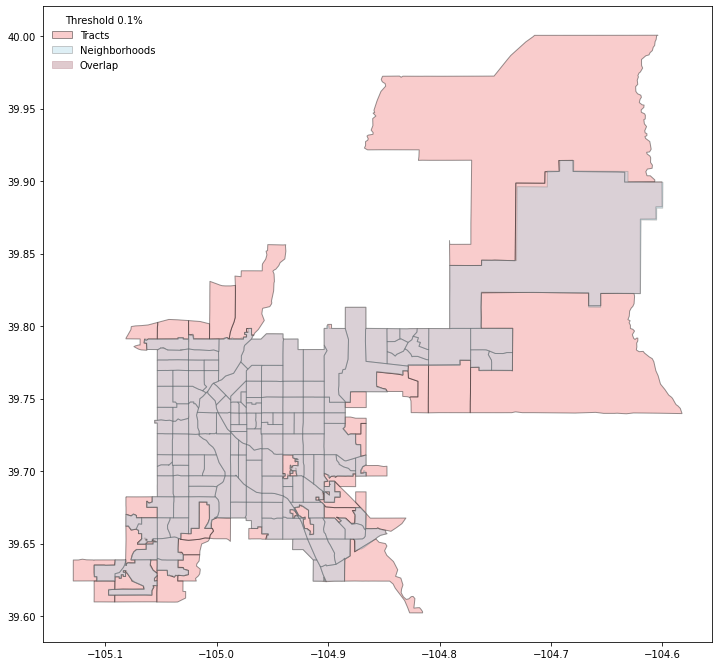

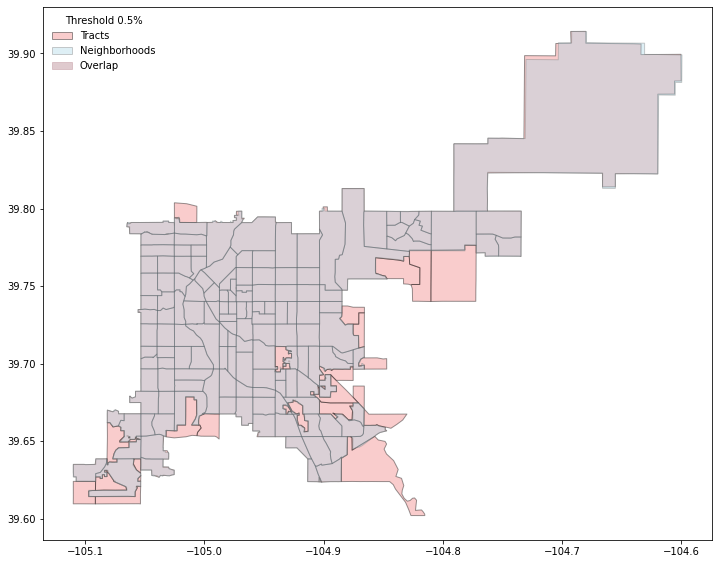

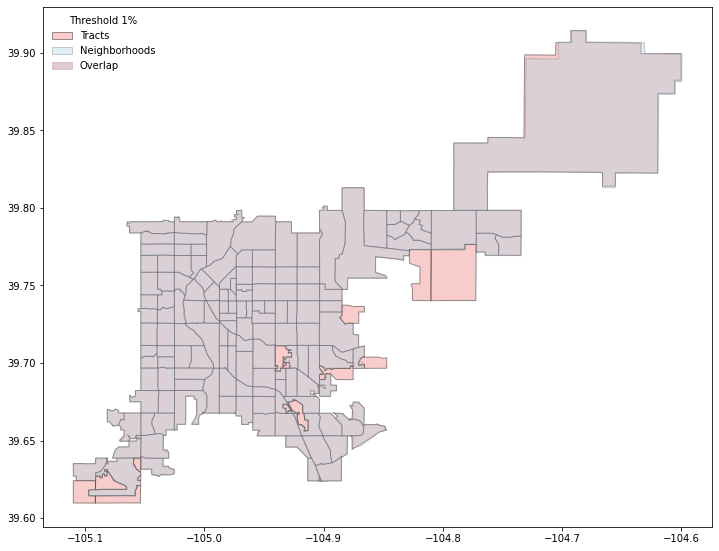

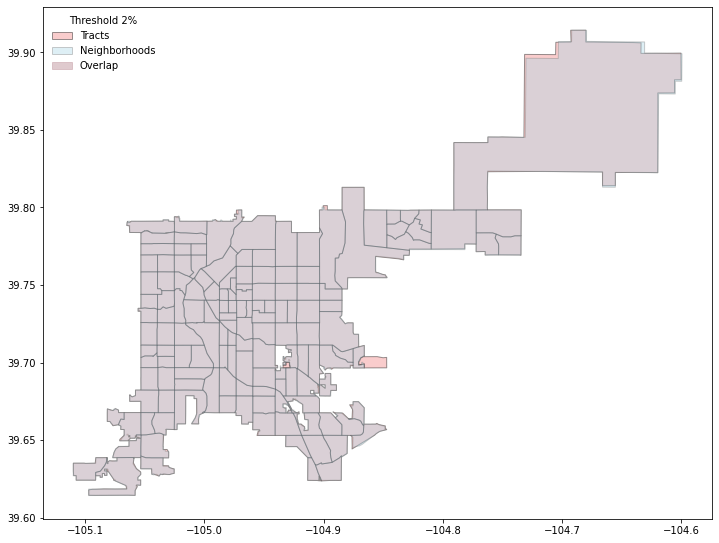

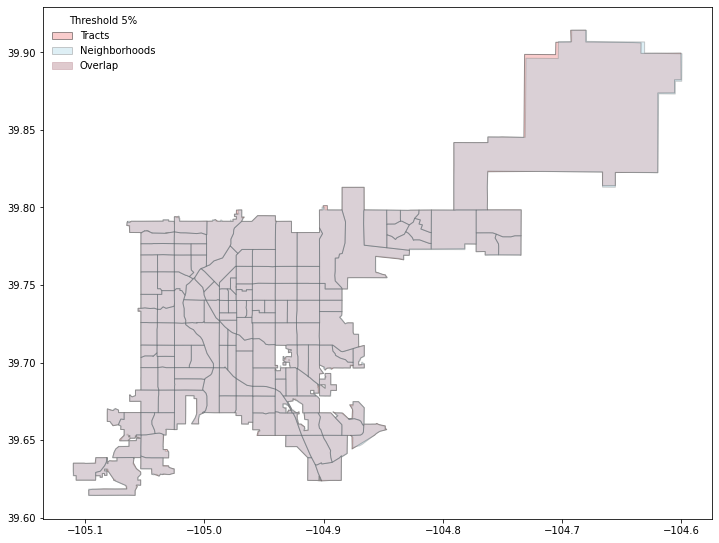

In [19]:
threshold_wrapper(city_list[4], city_results, threshold_list)

Detroit
Threshold:  0
Unique neighborhoods before: 208
       Unique tracts before: 350
          Neighborhood area: 35.9994
 Unique neighborhoods after: 208
        Unique tracts after: 350
         Total tracts after: 1217
              Filtered area: 35.9994
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 208
       Unique tracts before: 350
          Neighborhood area: 35.9994
 Unique neighborhoods after: 208
        Unique tracts after: 320
         Total tracts after: 722
              Filtered area: 35.9902
                  Area loss: 0.0256
                 Tract loss: 30
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 208
       Unique tracts before: 350
          Neighborhood area: 35.9994
 Unique neighborhoods after: 208
        Unique tracts after: 314
         Total tracts after: 629
            

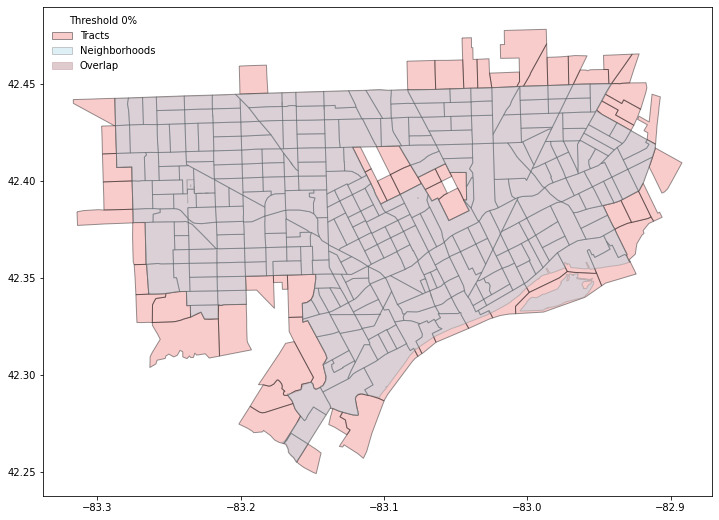

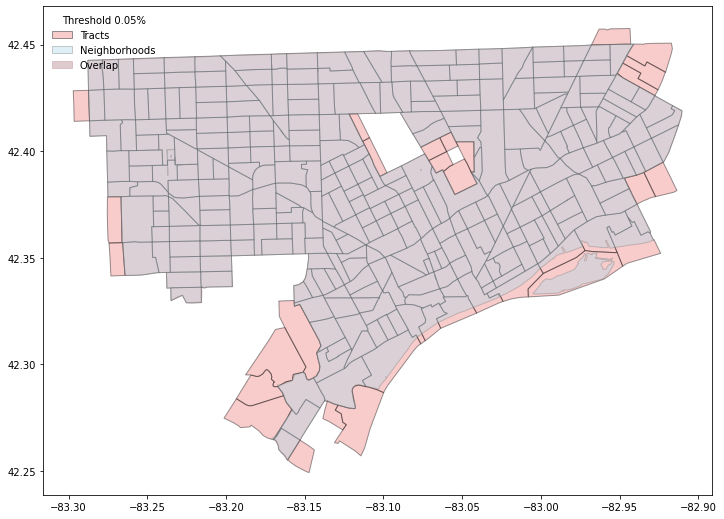

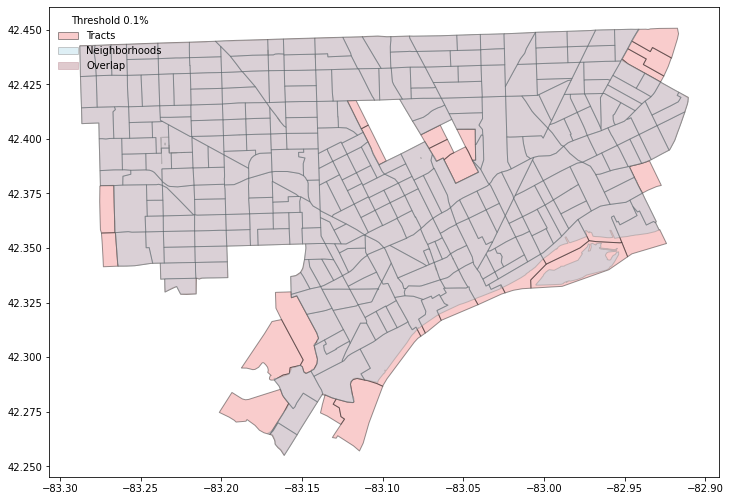

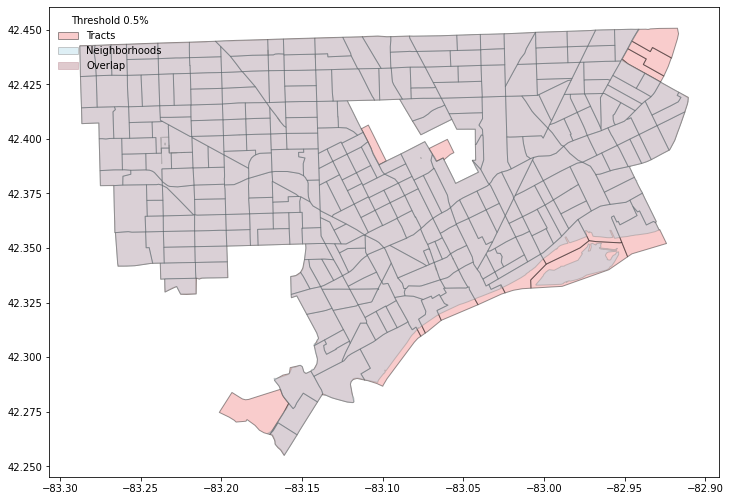

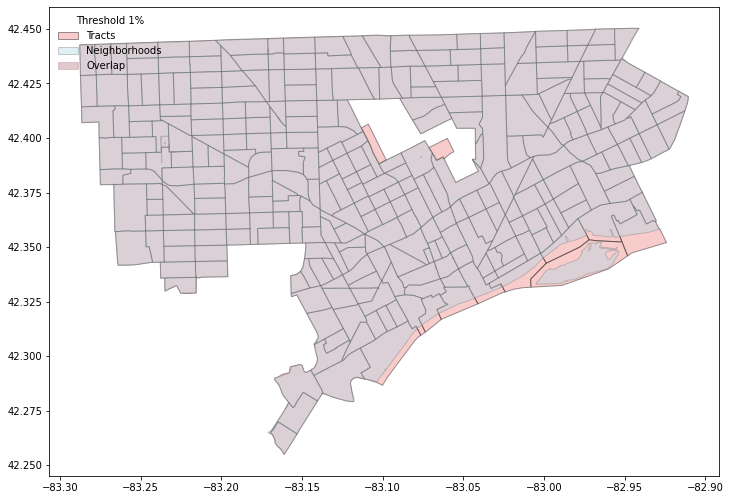

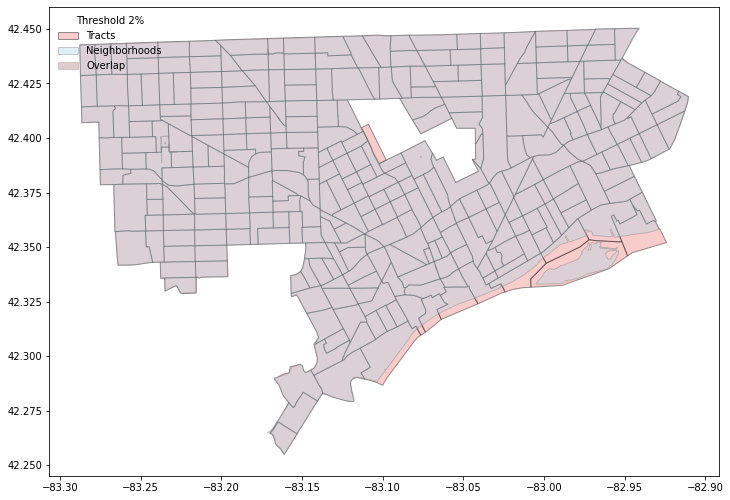

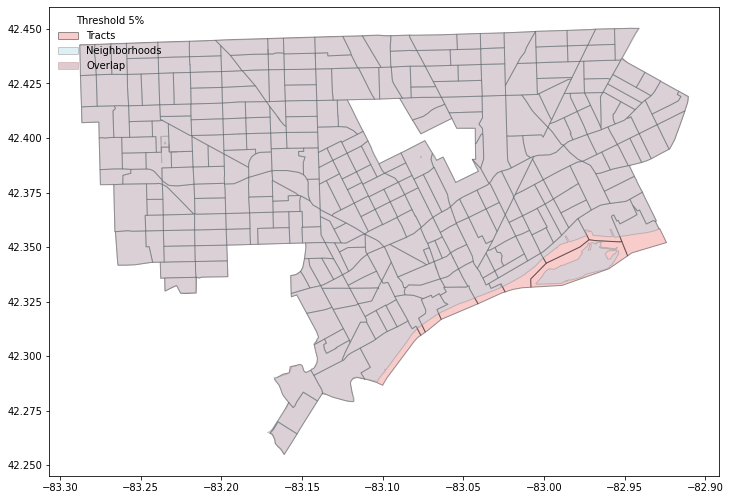

In [20]:
threshold_wrapper(city_list[5], city_results, threshold_list)

Houston
Threshold:  0
Unique neighborhoods before: 88
       Unique tracts before: 575
          Neighborhood area: 154.787
 Unique neighborhoods after: 88
        Unique tracts after: 575
         Total tracts after: 1155
              Filtered area: 154.787
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 88
       Unique tracts before: 575
          Neighborhood area: 154.787
 Unique neighborhoods after: 88
        Unique tracts after: 569
         Total tracts after: 1014
              Filtered area: 154.7777
                  Area loss: 0.006
                 Tract loss: 6
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 88
       Unique tracts before: 575
          Neighborhood area: 154.787
 Unique neighborhoods after: 88
        Unique tracts after: 564
         Total tracts after: 971
              Filt

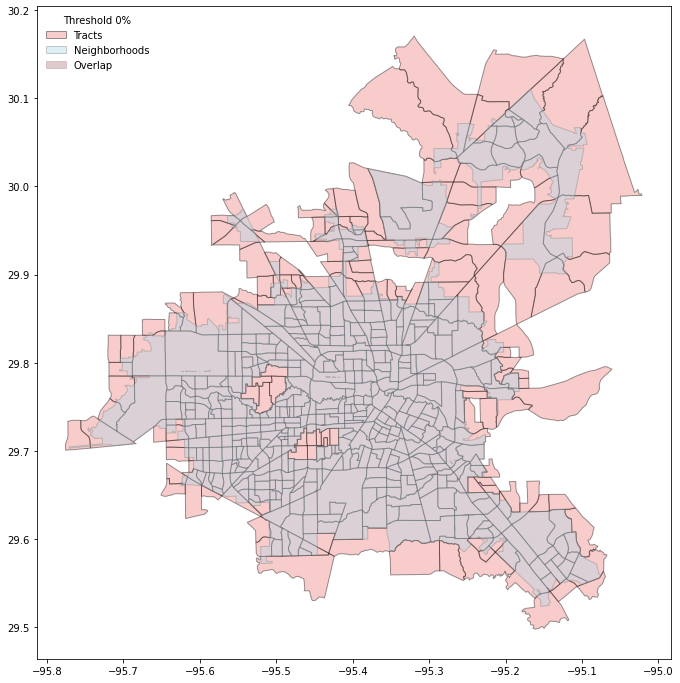

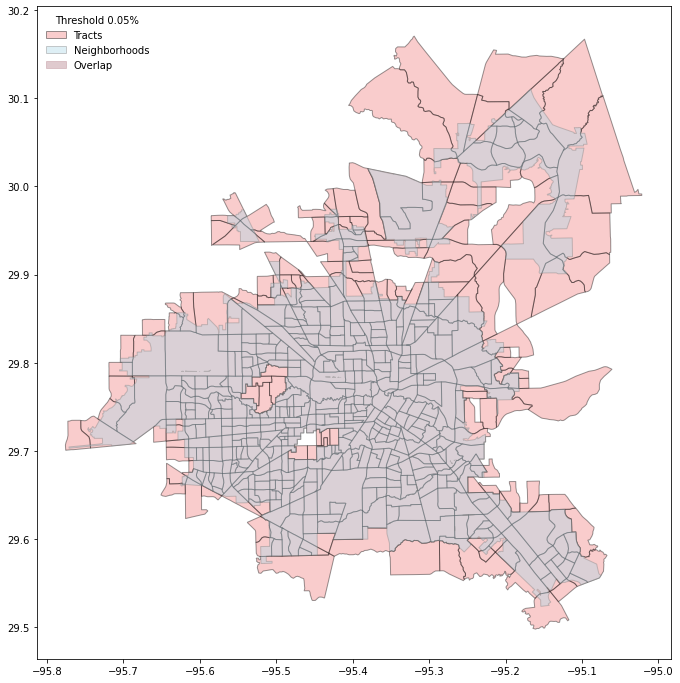

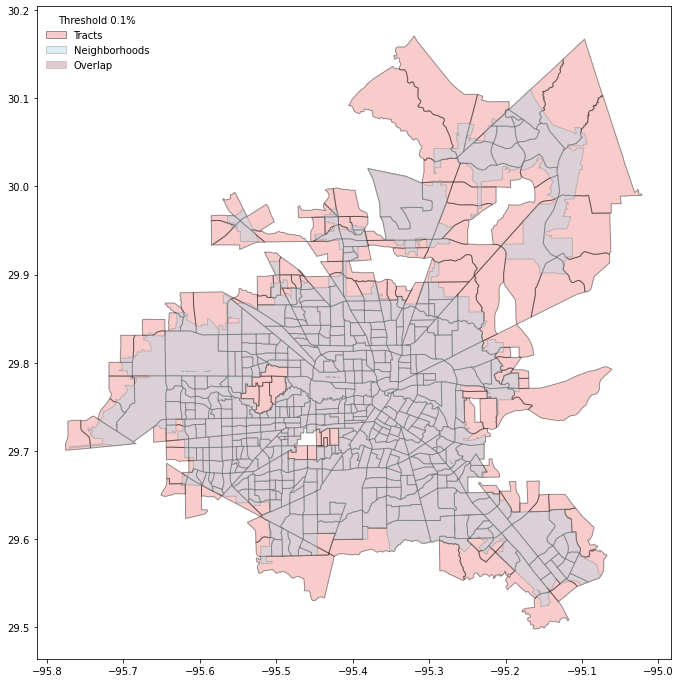

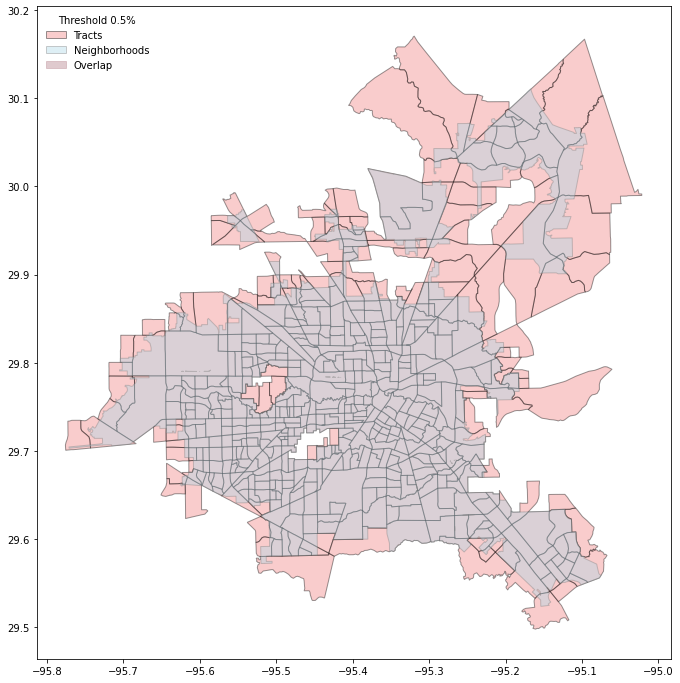

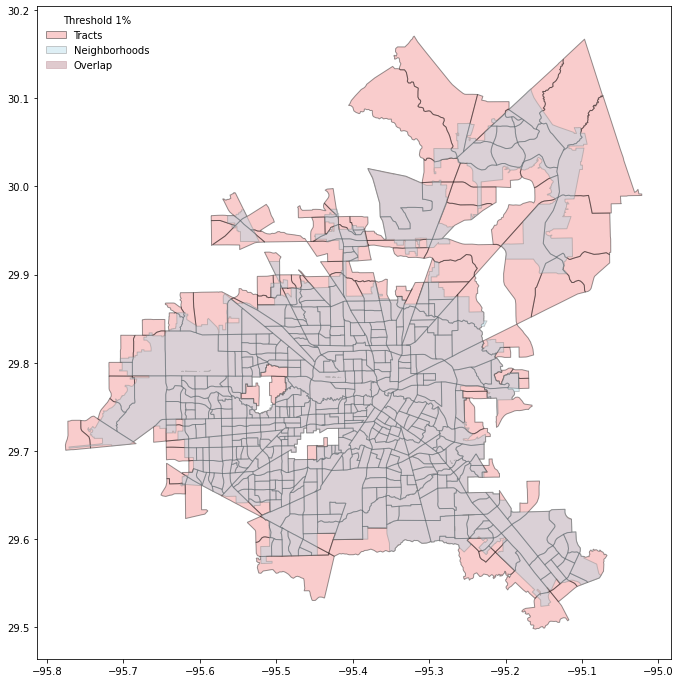

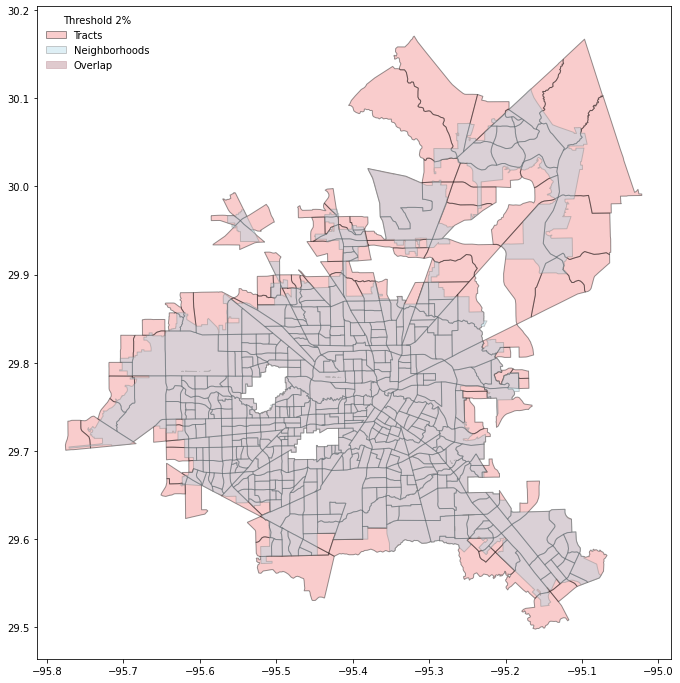

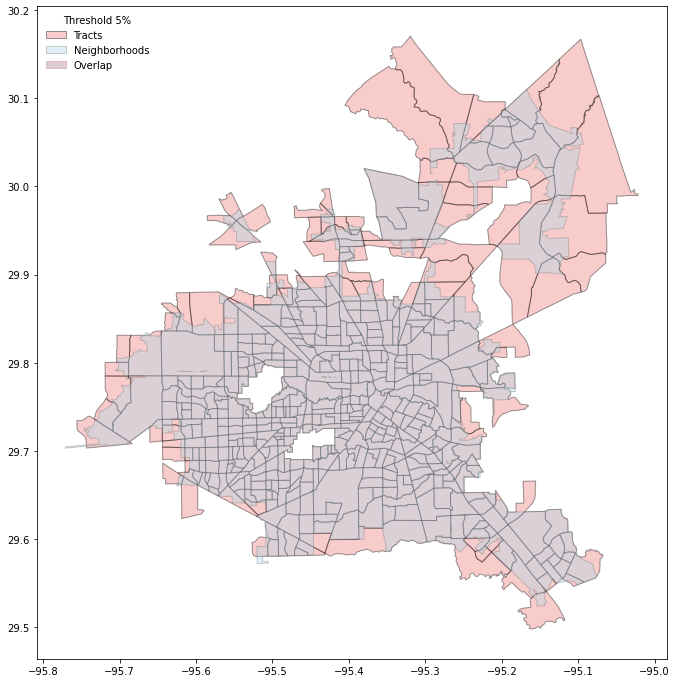

In [21]:
threshold_wrapper(city_list[6], city_results, threshold_list)

Indianapolis
Threshold:  0
Unique neighborhoods before: 99
       Unique tracts before: 247
          Neighborhood area: 104.3737
 Unique neighborhoods after: 99
        Unique tracts after: 247
         Total tracts after: 742
              Filtered area: 104.3735
                  Area loss: 0.0002
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 99
       Unique tracts before: 247
          Neighborhood area: 104.3737
 Unique neighborhoods after: 99
        Unique tracts after: 232
         Total tracts after: 562
              Filtered area: 104.3536
                  Area loss: 0.0193
                 Tract loss: 15
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 99
       Unique tracts before: 247
          Neighborhood area: 104.3737
 Unique neighborhoods after: 99
        Unique tracts after: 228
         Total tracts after: 515
      

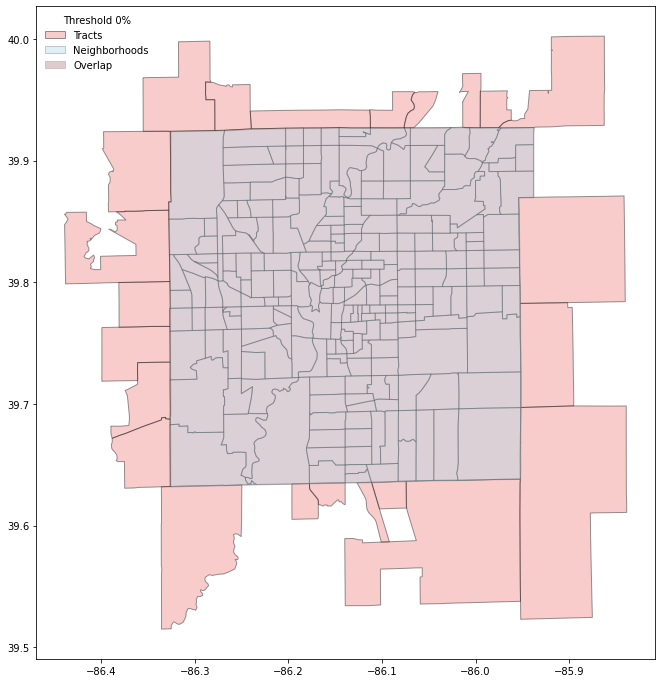

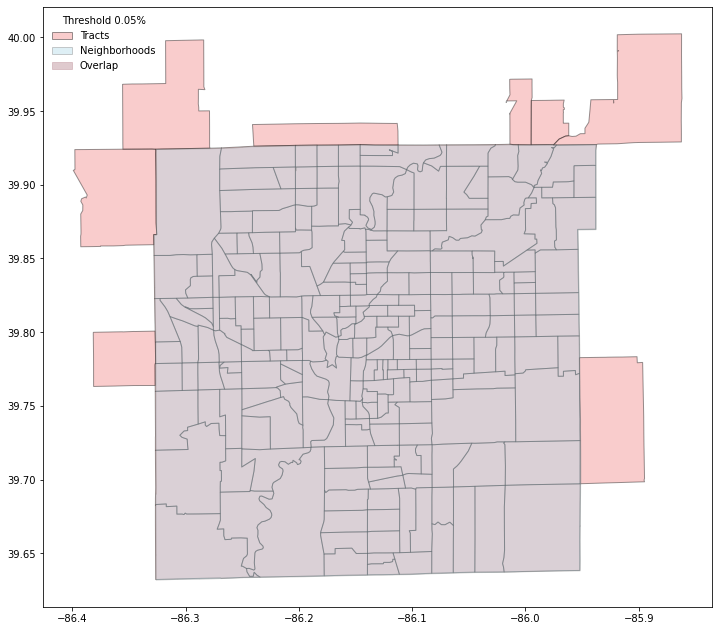

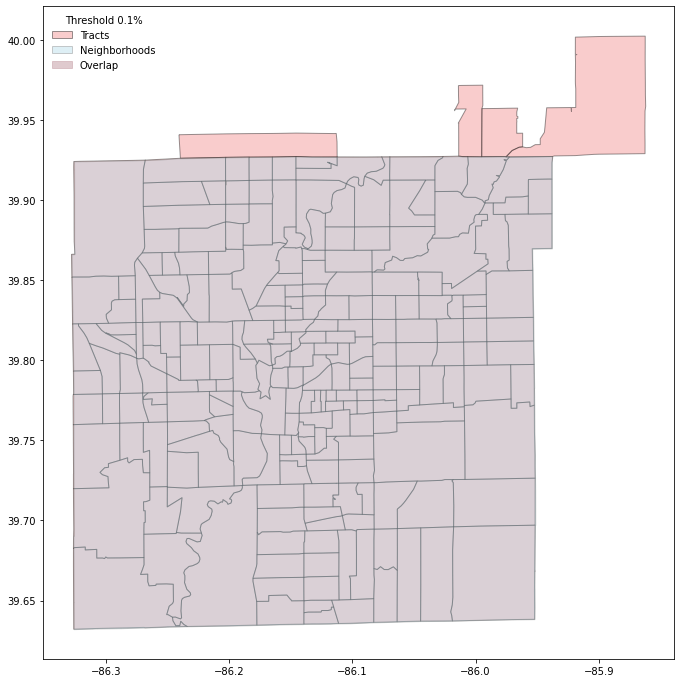

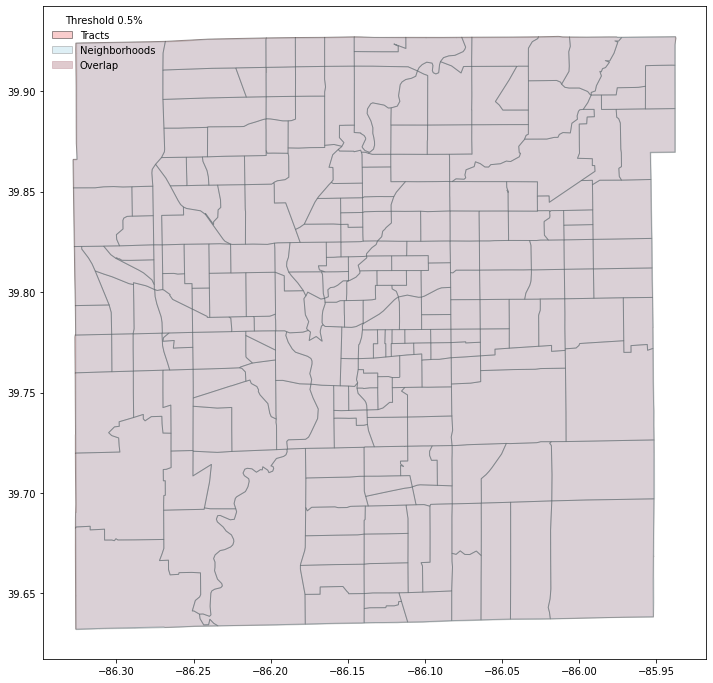

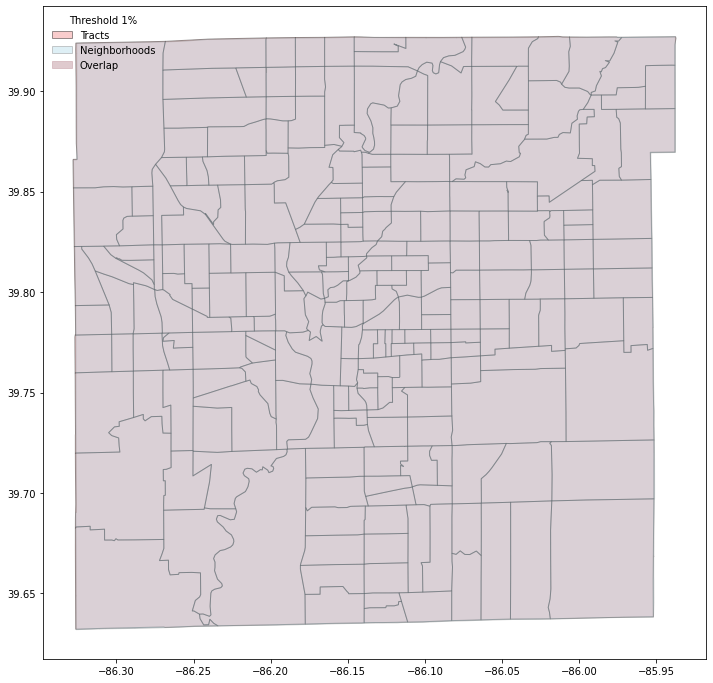

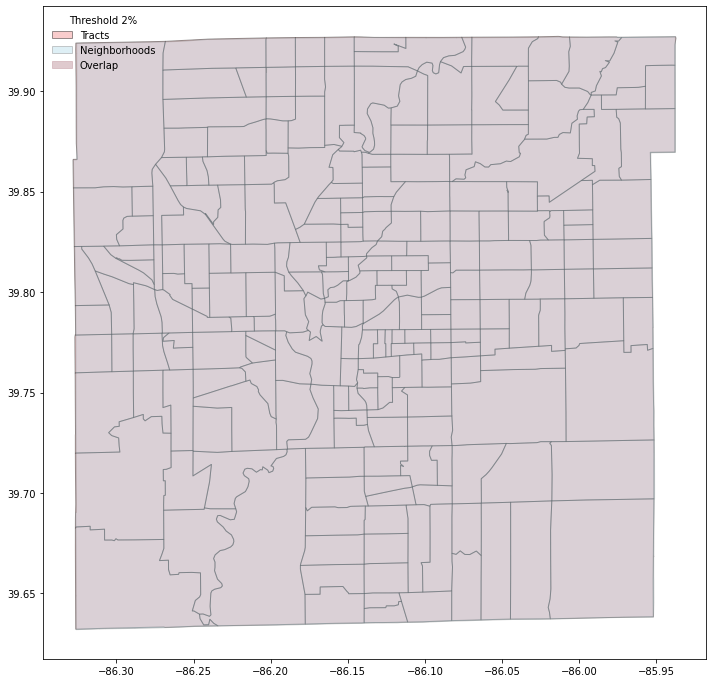

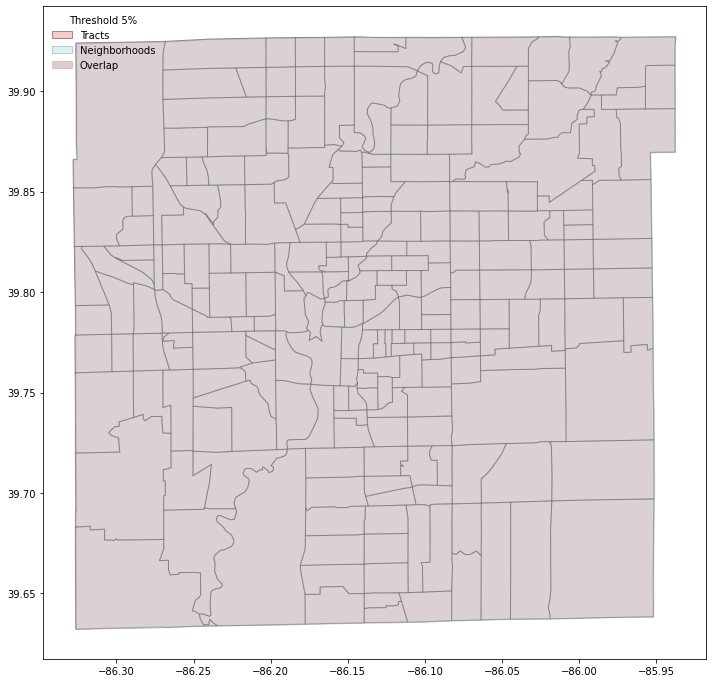

In [22]:
threshold_wrapper(city_list[7], city_results, threshold_list)

Los Angeles
Threshold:  0
Unique neighborhoods before: 272
       Unique tracts before: 2396
          Neighborhood area: 1043.459
 Unique neighborhoods after: 272
        Unique tracts after: 2396
         Total tracts after: 5017
              Filtered area: 1043.0846
                  Area loss: 0.0359
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 272
       Unique tracts before: 2396
          Neighborhood area: 1043.459
 Unique neighborhoods after: 272
        Unique tracts after: 2376
         Total tracts after: 4362
              Filtered area: 1042.7532
                  Area loss: 0.0676
                 Tract loss: 20
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 272
       Unique tracts before: 2396
          Neighborhood area: 1043.459
 Unique neighborhoods after: 272
        Unique tracts after: 2370
         Total tracts af

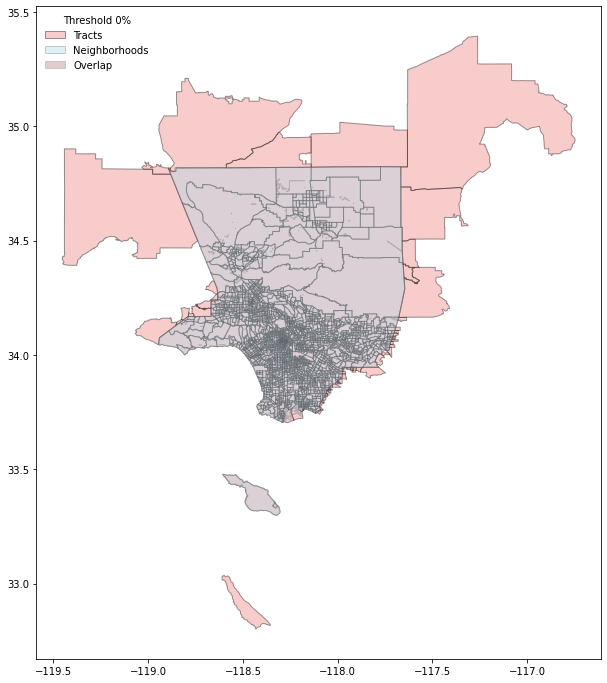

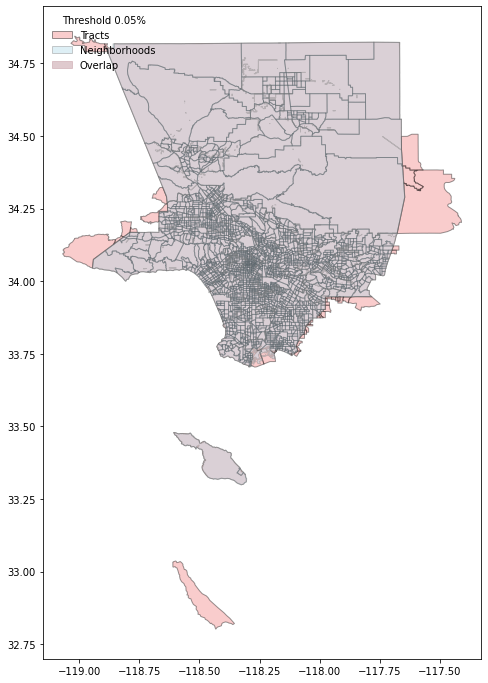

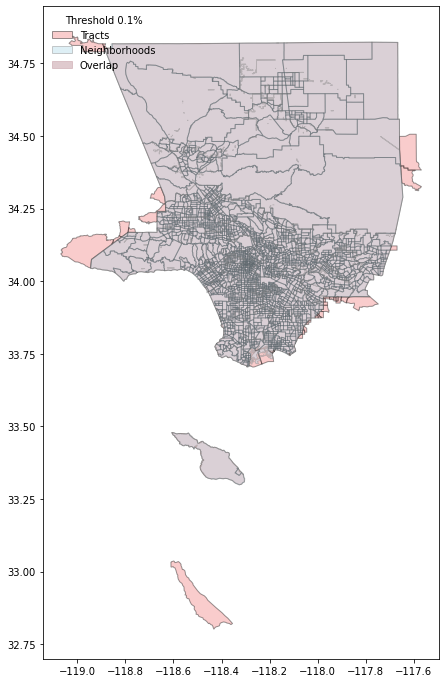

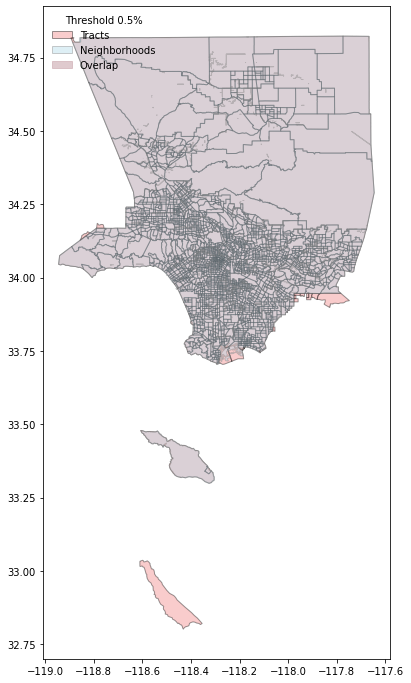

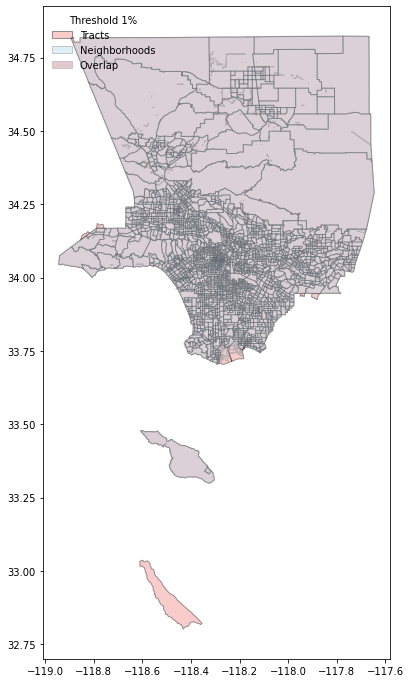

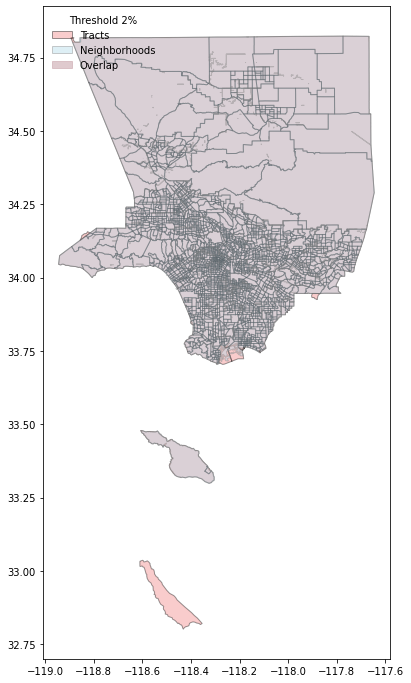

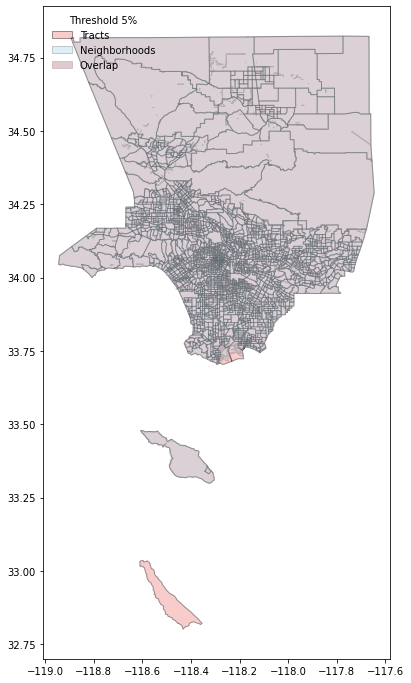

In [23]:
threshold_wrapper(city_list[8], city_results, threshold_list)

Louisville
Threshold:  0
Unique neighborhoods before: 92
       Unique tracts before: 100
          Neighborhood area: 16.1011
 Unique neighborhoods after: 92
        Unique tracts after: 100
         Total tracts after: 435
              Filtered area: 16.1011
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 92
       Unique tracts before: 100
          Neighborhood area: 16.1011
 Unique neighborhoods after: 92
        Unique tracts after: 100
         Total tracts after: 320
              Filtered area: 16.0957
                  Area loss: 0.0335
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 92
       Unique tracts before: 100
          Neighborhood area: 16.1011
 Unique neighborhoods after: 92
        Unique tracts after: 100
         Total tracts after: 292
              Fil

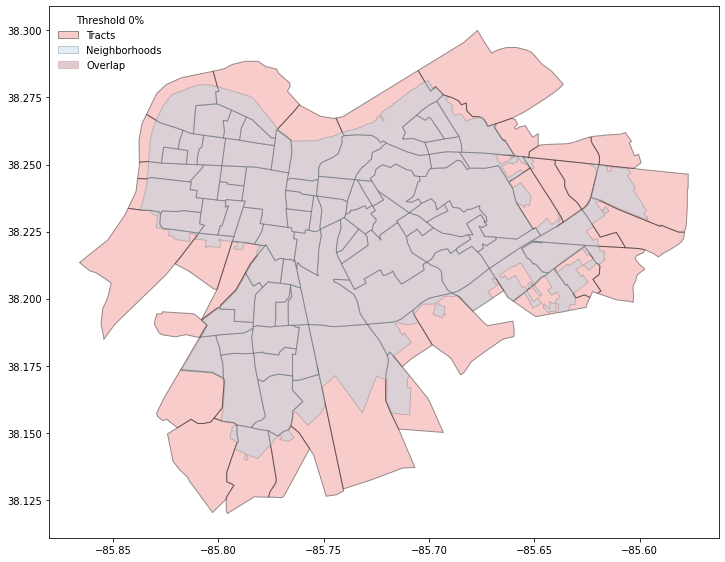

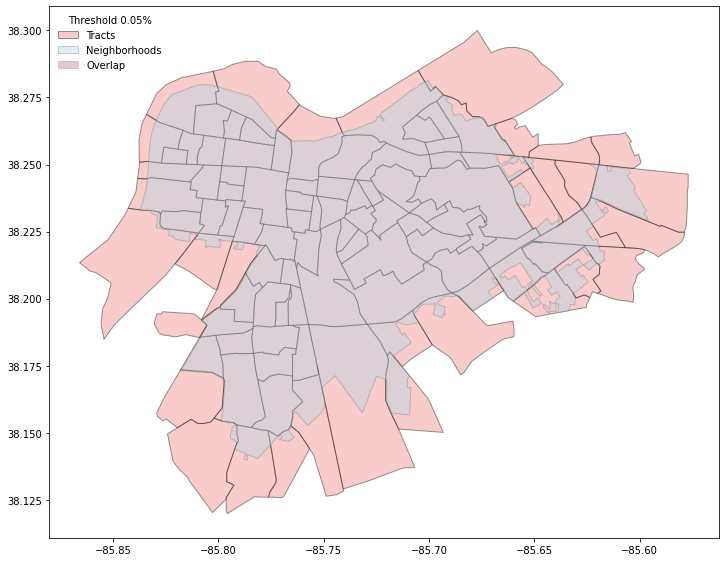

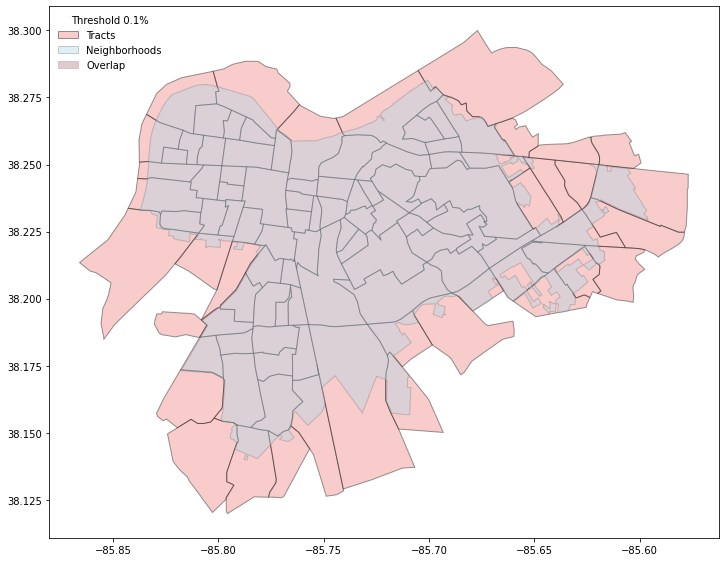

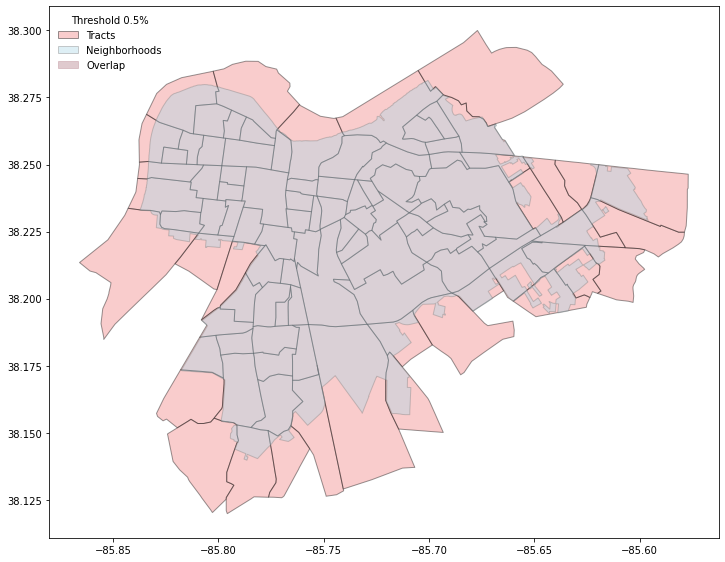

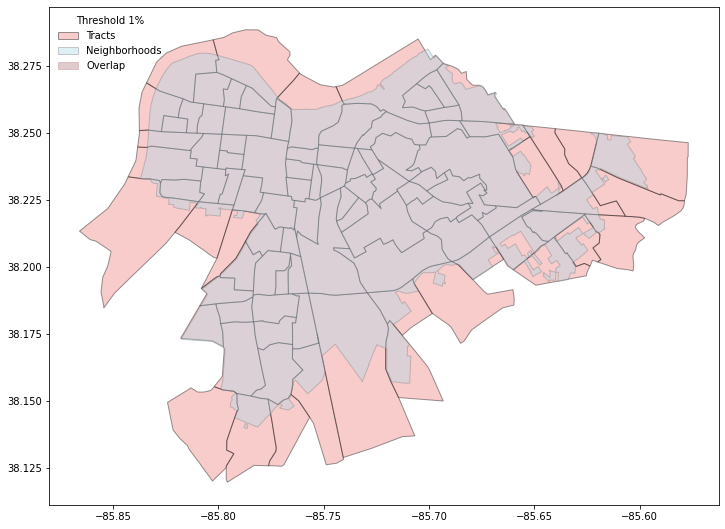

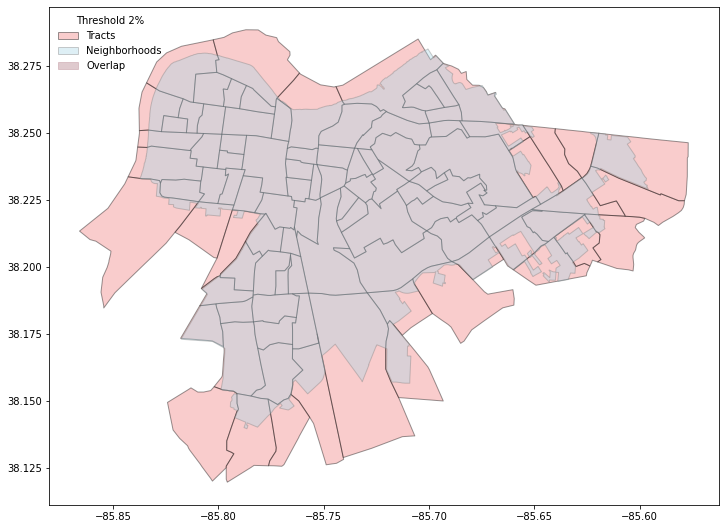

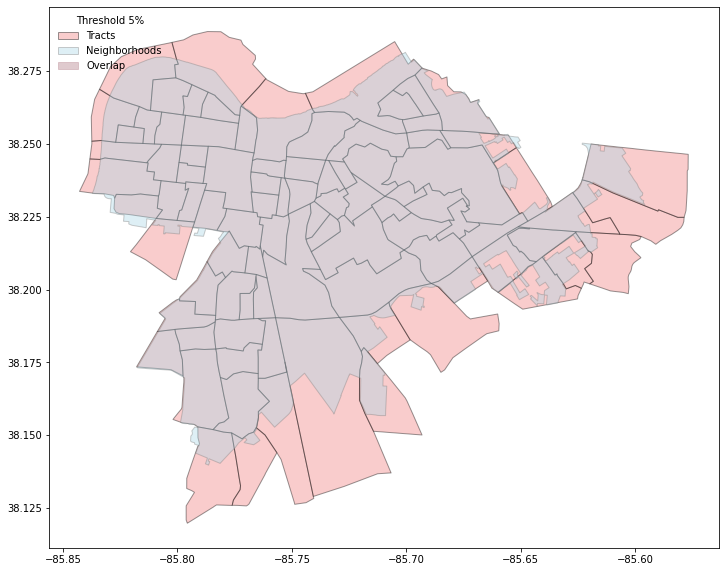

In [24]:
threshold_wrapper(city_list[9], city_results, threshold_list)

Phoenix
Threshold:  0
Unique neighborhoods before: 15
       Unique tracts before: 406
          Neighborhood area: 144.0038
 Unique neighborhoods after: 15
        Unique tracts after: 406
         Total tracts after: 551
              Filtered area: 144.0038
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 15
       Unique tracts before: 406
          Neighborhood area: 144.0038
 Unique neighborhoods after: 15
        Unique tracts after: 388
         Total tracts after: 492
              Filtered area: 143.9837
                  Area loss: 0.014
                 Tract loss: 18
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 15
       Unique tracts before: 406
          Neighborhood area: 144.0038
 Unique neighborhoods after: 15
        Unique tracts after: 379
         Total tracts after: 468
              F

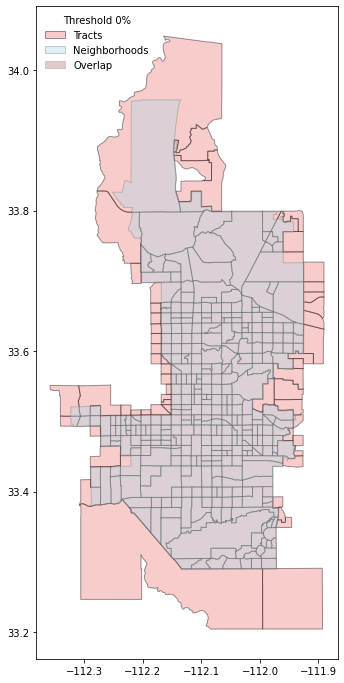

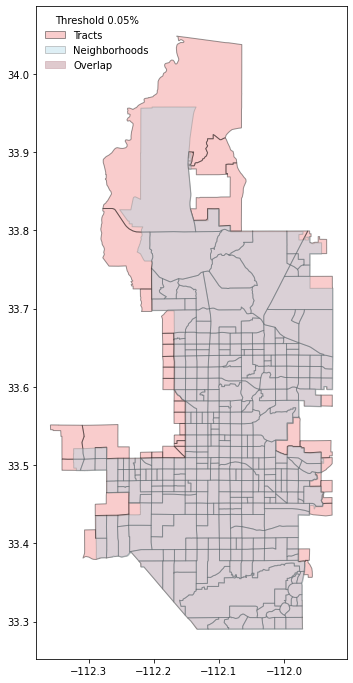

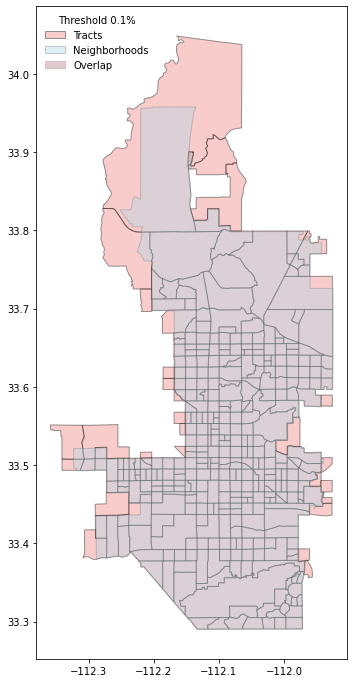

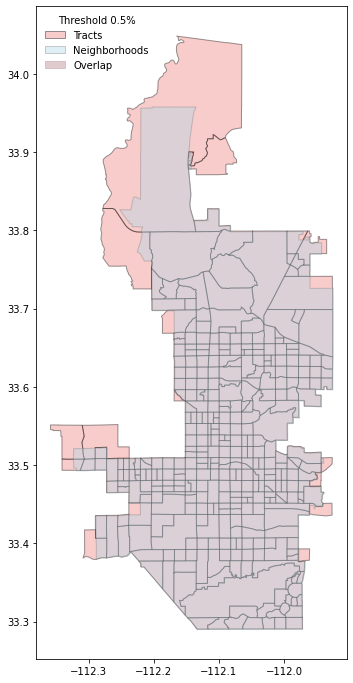

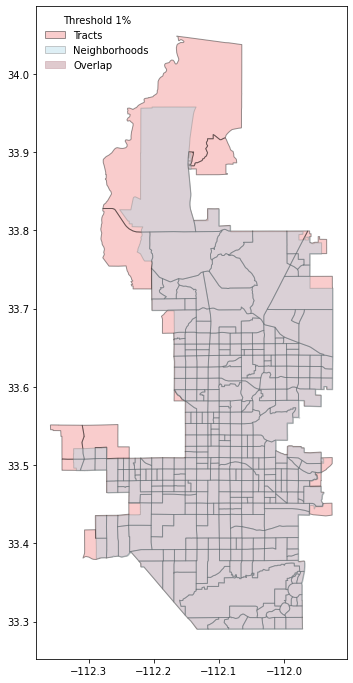

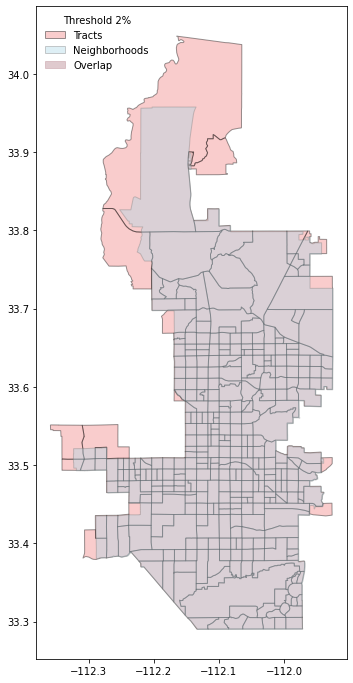

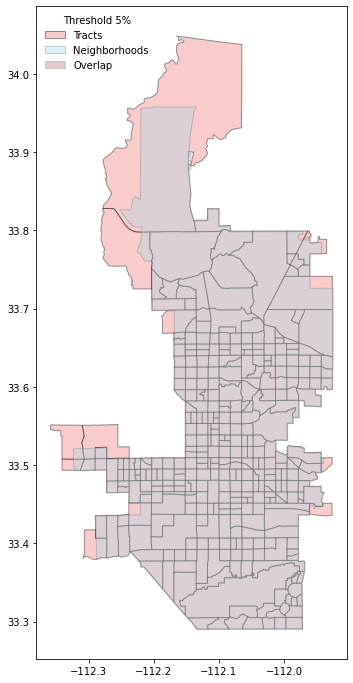

In [25]:
threshold_wrapper(city_list[10], city_results, threshold_list)

Portland
Threshold:  0
Unique neighborhoods before: 130
       Unique tracts before: 169
          Neighborhood area: 39.0457
 Unique neighborhoods after: 130
        Unique tracts after: 169
         Total tracts after: 651
              Filtered area: 39.0457
                  Area loss: 0.0
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 130
       Unique tracts before: 169
          Neighborhood area: 39.0457
 Unique neighborhoods after: 126
        Unique tracts after: 162
         Total tracts after: 519
              Filtered area: 39.0256
                  Area loss: 0.0515
                 Tract loss: 7
          Neighborhood loss: 4
Missing neighborhoods:  [120 121 122 123] 

Threshold:  0.1
Unique neighborhoods before: 130
       Unique tracts before: 169
          Neighborhood area: 39.0457
 Unique neighborhoods after: 125
        Unique tracts after: 162
         Total tracts after: 48

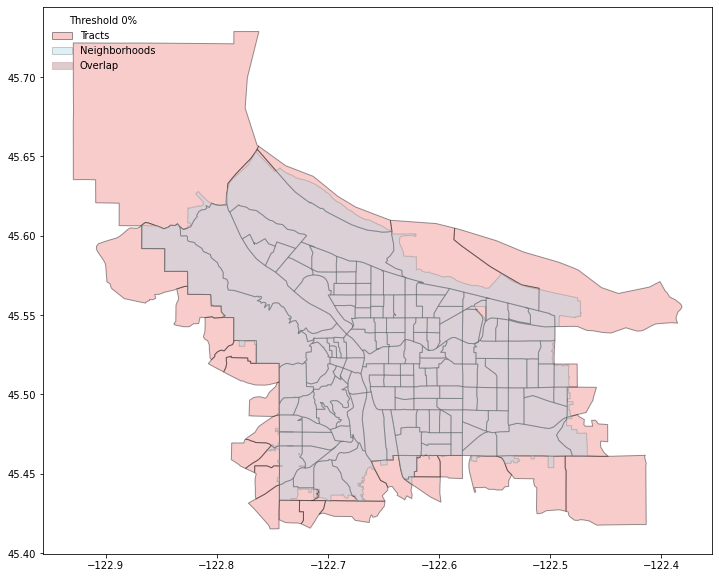

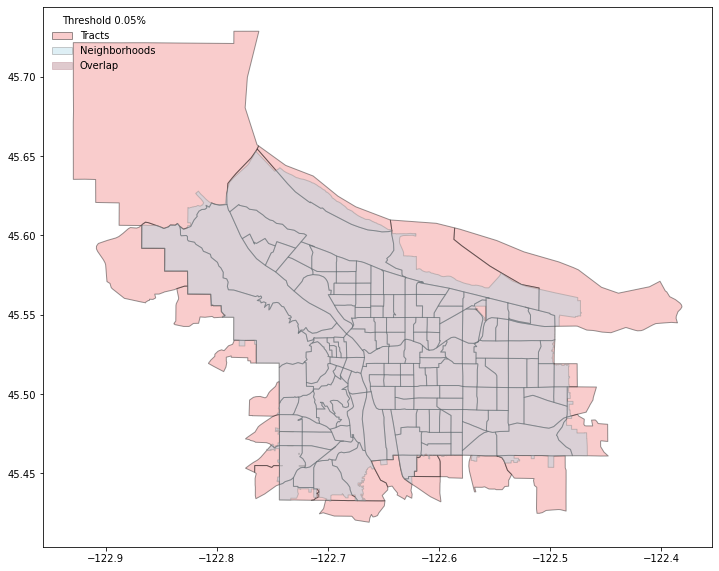

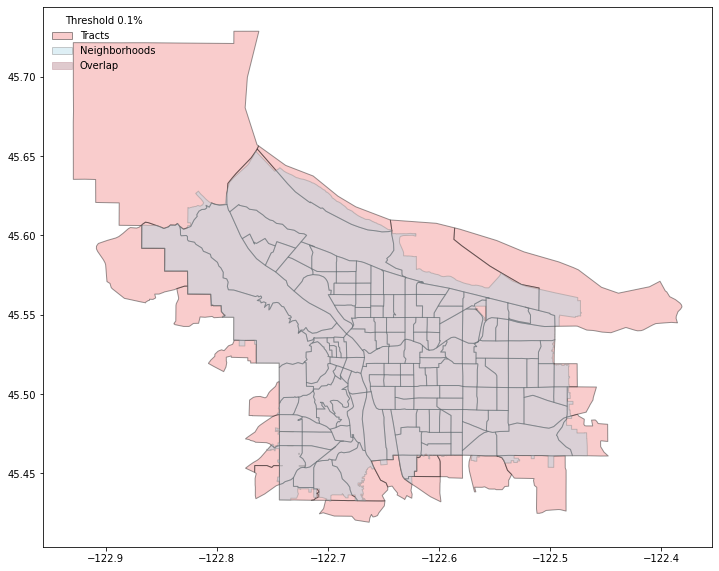

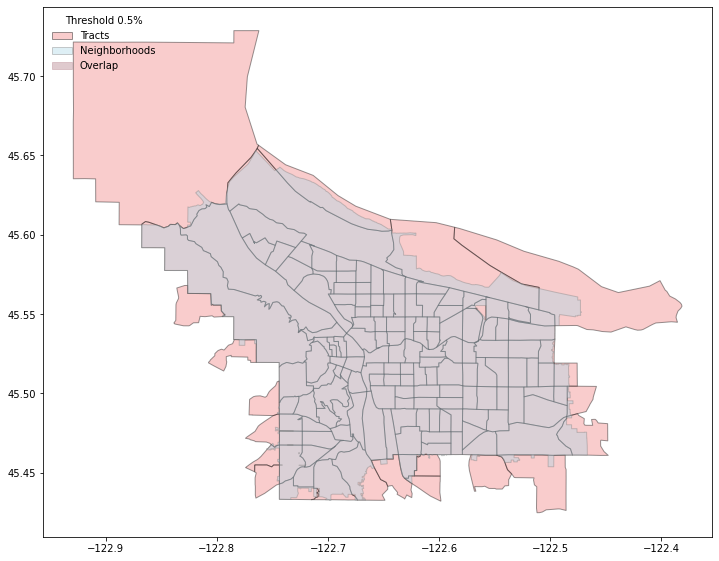

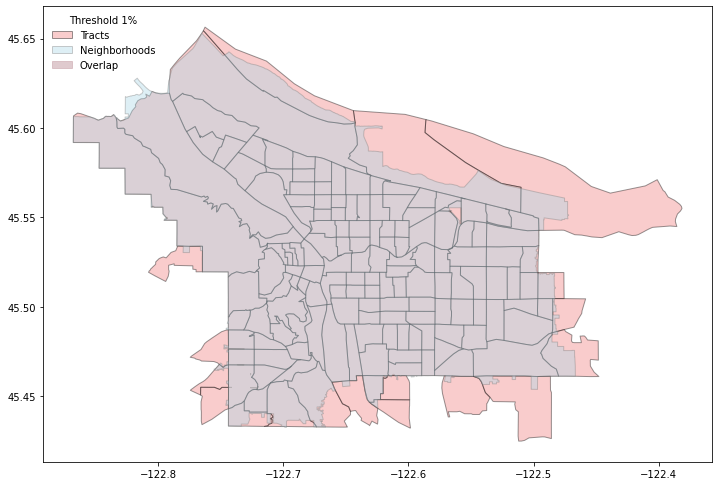

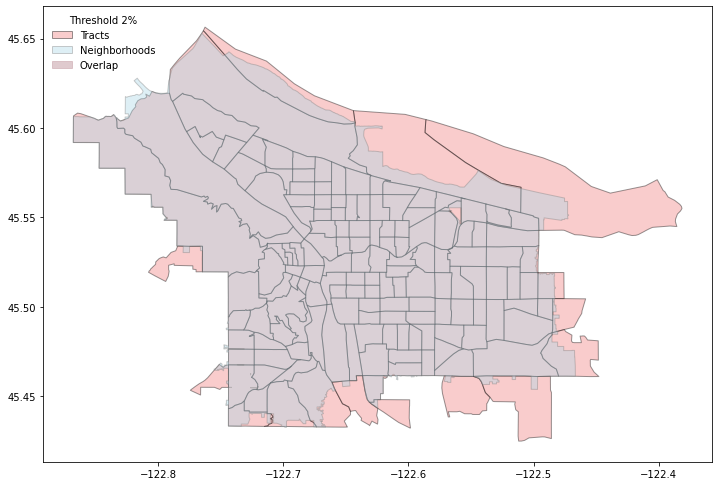

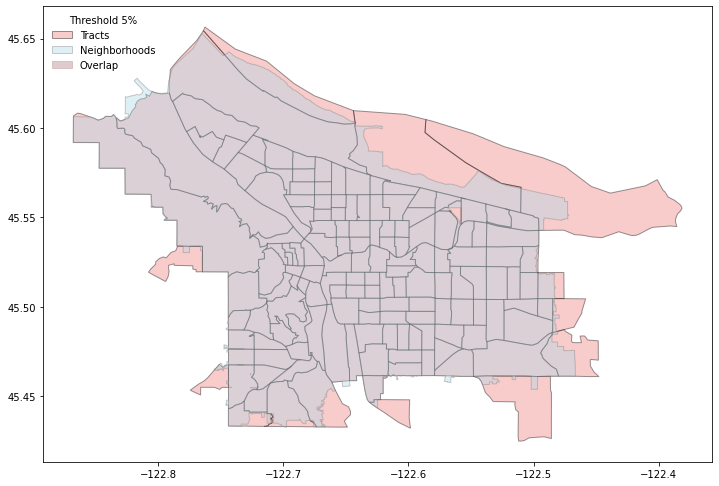

In [28]:
threshold_wrapper([portland, 'Portland', 'OBJECTID', 'or'], city_results, threshold_list)

San Diego
Threshold:  0
Unique neighborhoods before: 57
       Unique tracts before: 332
          Neighborhood area: 86.1012
 Unique neighborhoods after: 57
        Unique tracts after: 332
         Total tracts after: 701
              Filtered area: 86.0852
                  Area loss: 0.0186
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 57
       Unique tracts before: 332
          Neighborhood area: 86.1012
 Unique neighborhoods after: 57
        Unique tracts after: 324
         Total tracts after: 595
              Filtered area: 86.0751
                  Area loss: 0.0303
                 Tract loss: 8
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 57
       Unique tracts before: 332
          Neighborhood area: 86.1012
 Unique neighborhoods after: 57
        Unique tracts after: 319
         Total tracts after: 571
              F

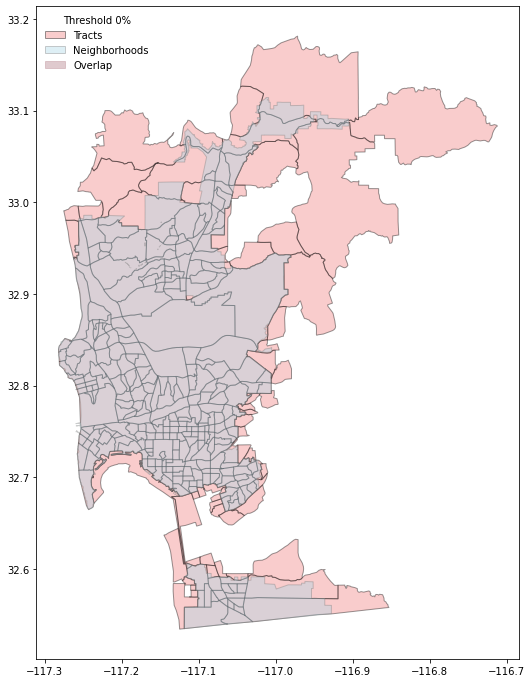

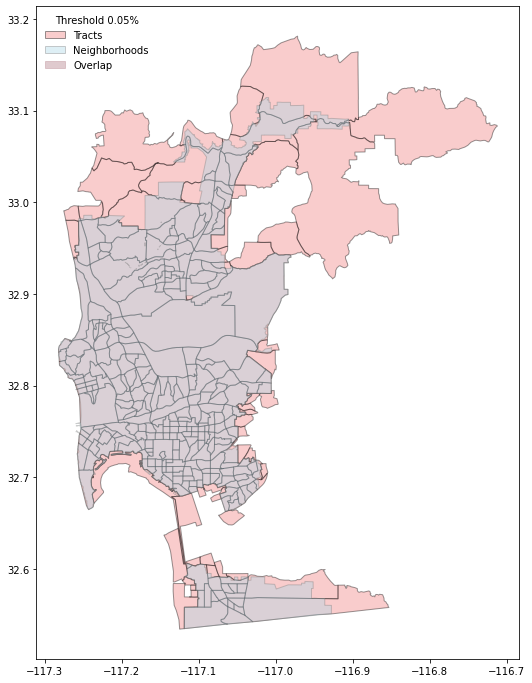

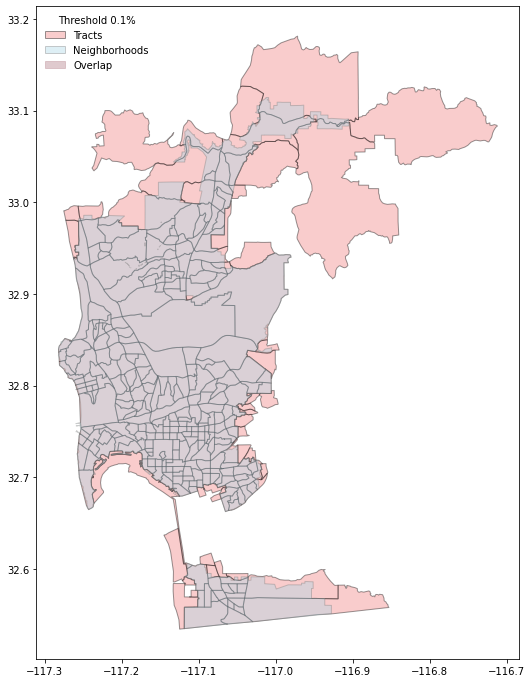

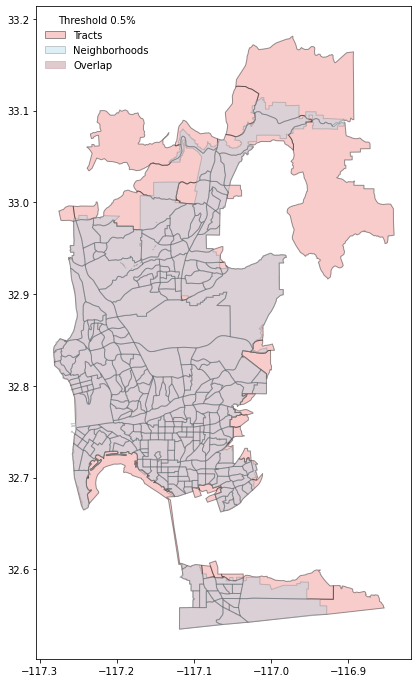

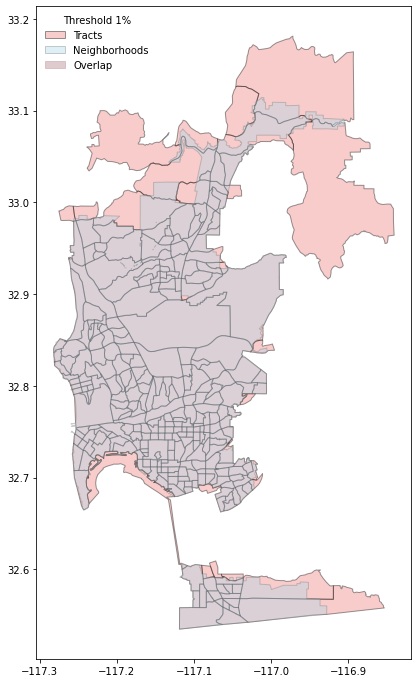

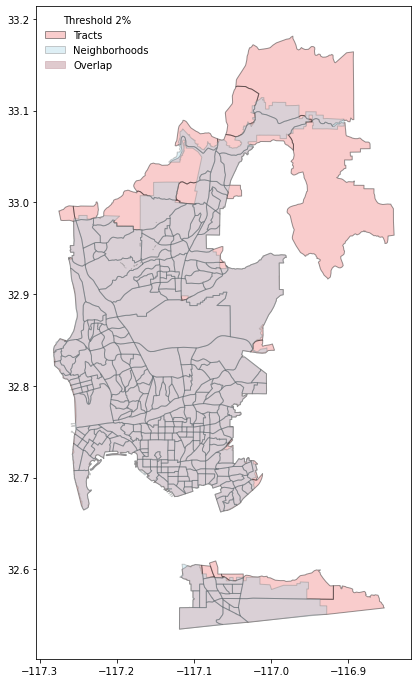

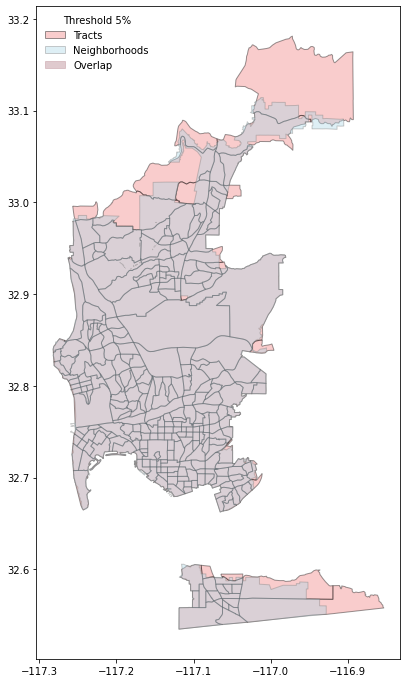

In [29]:
threshold_wrapper(city_list[12], city_results, threshold_list)

San Francisco
Threshold:  0
Unique neighborhoods before: 117
       Unique tracts before: 200
          Neighborhood area: 12.2641
 Unique neighborhoods after: 117
        Unique tracts after: 200
         Total tracts after: 701
              Filtered area: 12.2107
                  Area loss: 0.4354
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 117
       Unique tracts before: 200
          Neighborhood area: 12.2641
 Unique neighborhoods after: 117
        Unique tracts after: 199
         Total tracts after: 571
              Filtered area: 12.2097
                  Area loss: 0.4436
                 Tract loss: 1
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 117
       Unique tracts before: 200
          Neighborhood area: 12.2641
 Unique neighborhoods after: 117
        Unique tracts after: 198
         Total tracts after: 538
     

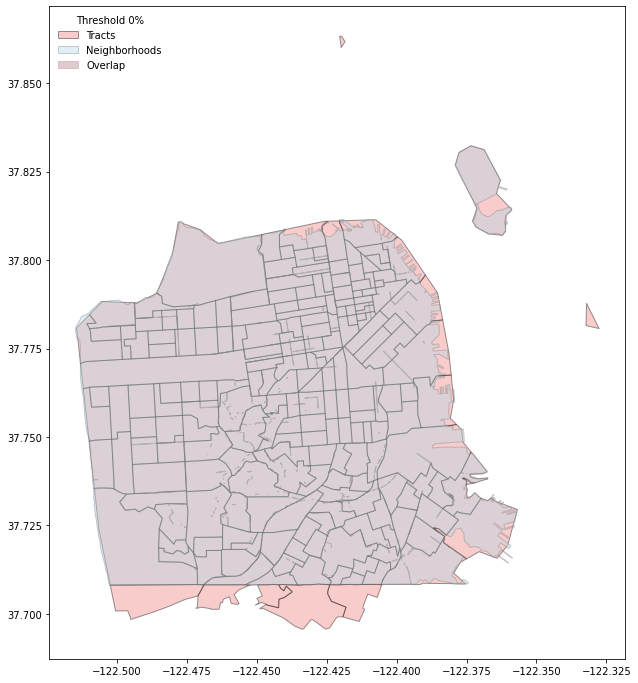

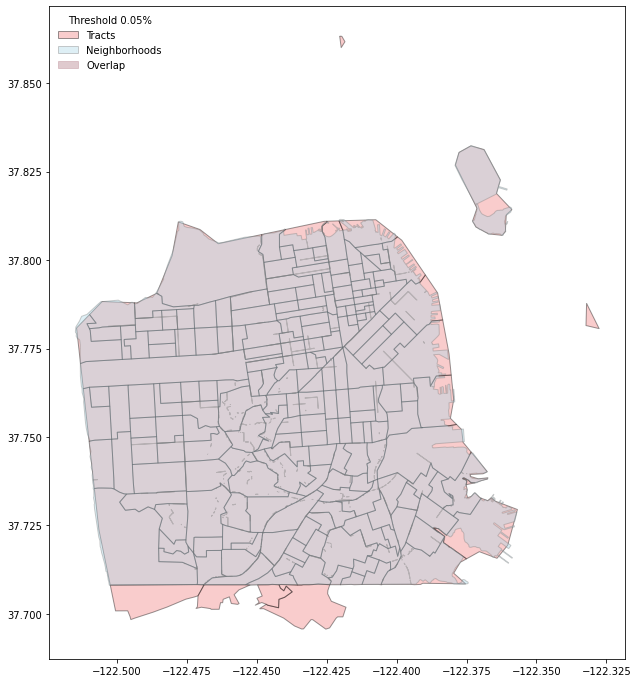

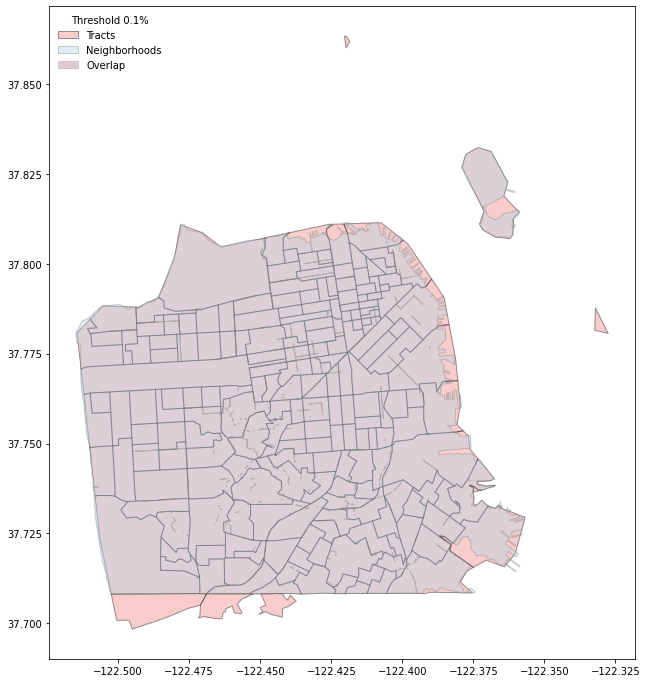

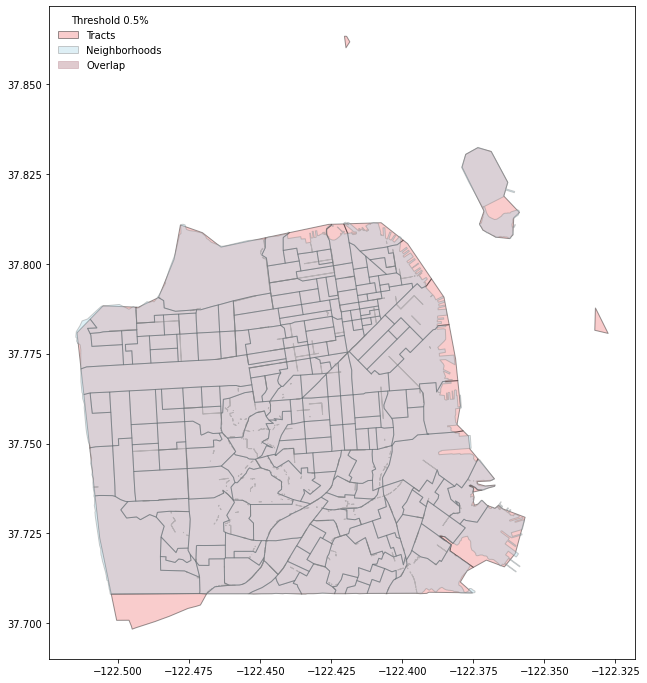

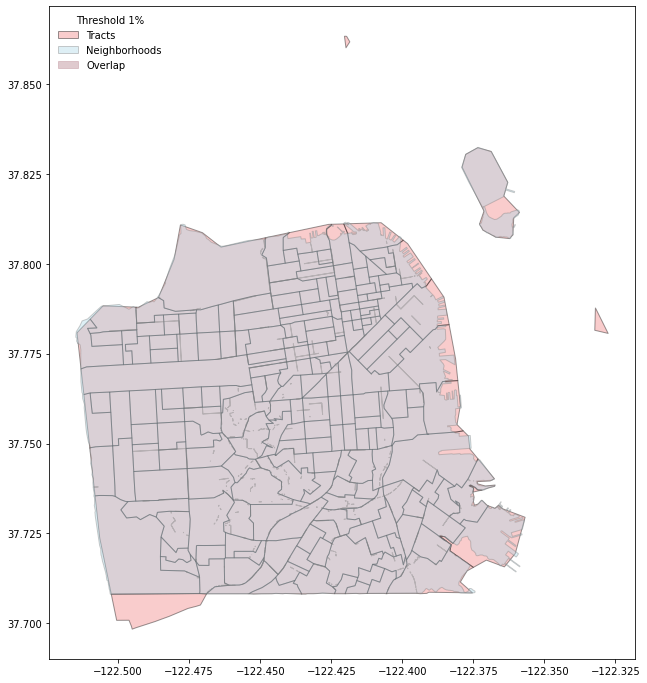

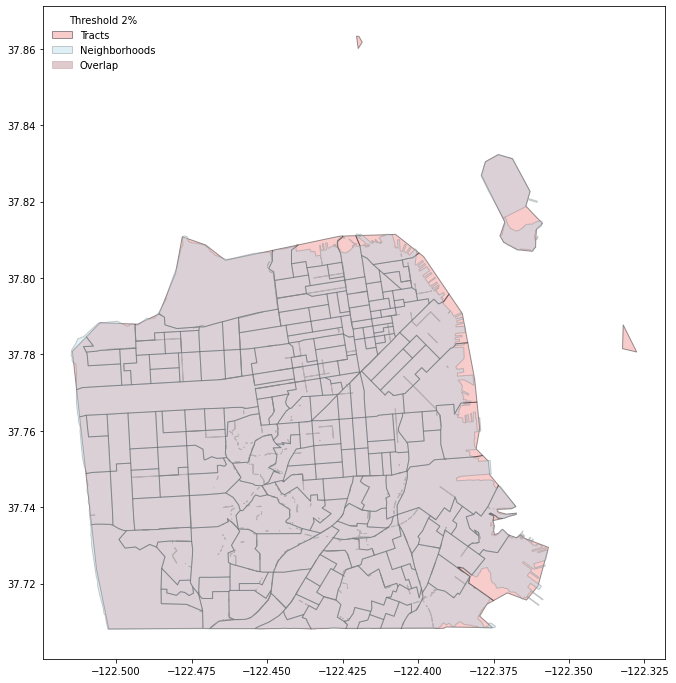

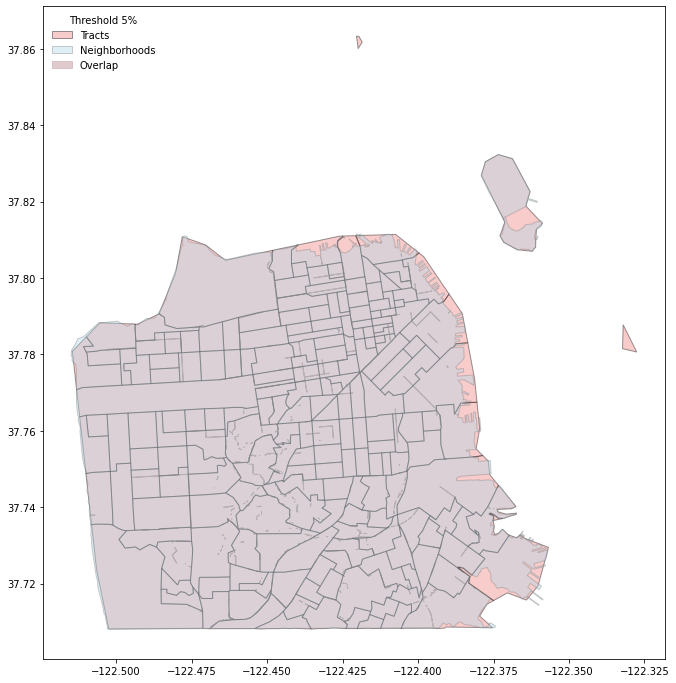

In [30]:
threshold_wrapper(city_list[13], city_results, threshold_list)

San Jose
Threshold:  0
Unique neighborhoods before: 66
       Unique tracts before: 396
          Neighborhood area: 335.6923
 Unique neighborhoods after: 66
        Unique tracts after: 396
         Total tracts after: 929
              Filtered area: 335.692
                  Area loss: 0.0001
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 66
       Unique tracts before: 396
          Neighborhood area: 335.6923
 Unique neighborhoods after: 66
        Unique tracts after: 386
         Total tracts after: 791
              Filtered area: 335.5744
                  Area loss: 0.0351
                 Tract loss: 10
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 66
       Unique tracts before: 396
          Neighborhood area: 335.6923
 Unique neighborhoods after: 66
        Unique tracts after: 384
         Total tracts after: 762
           

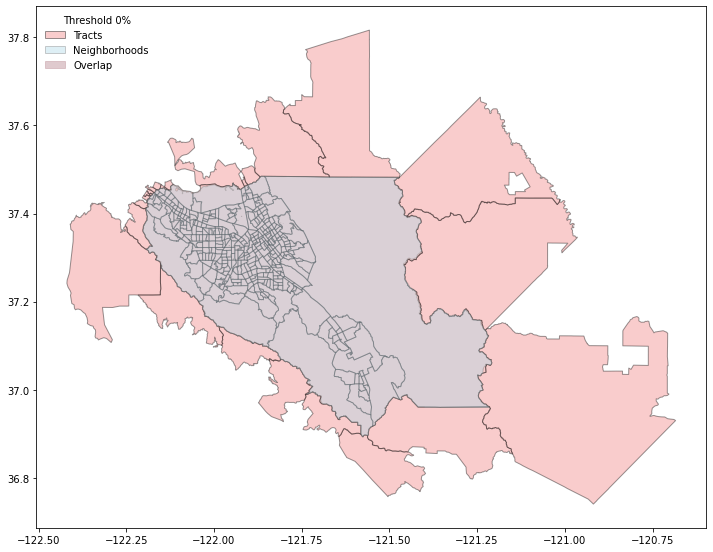

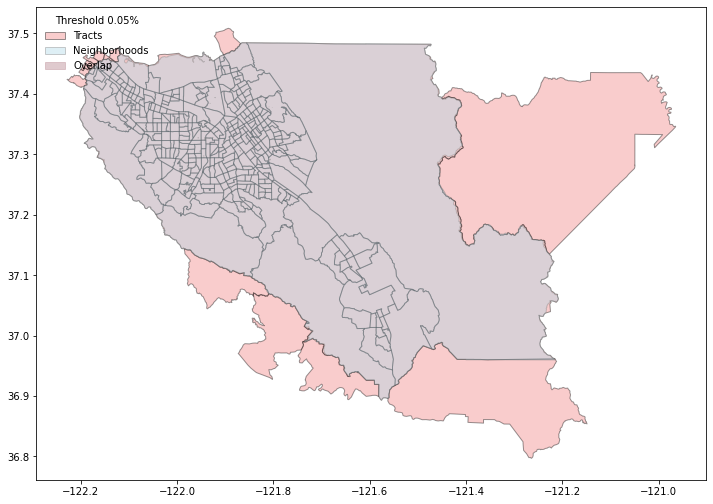

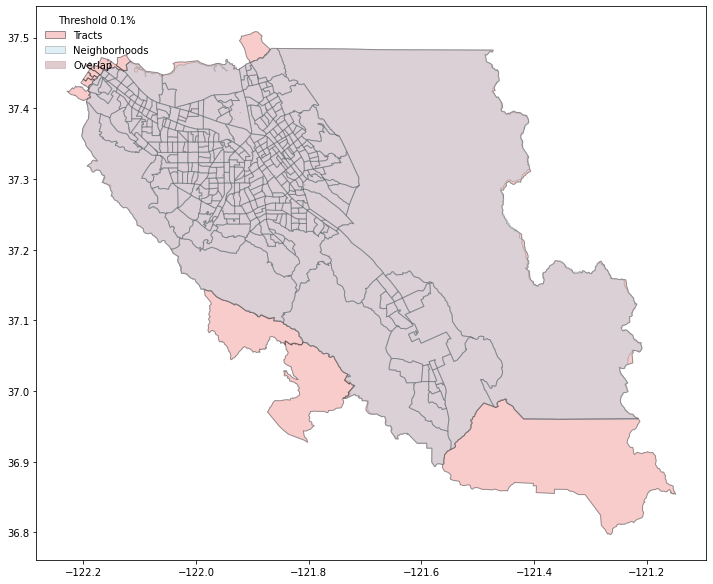

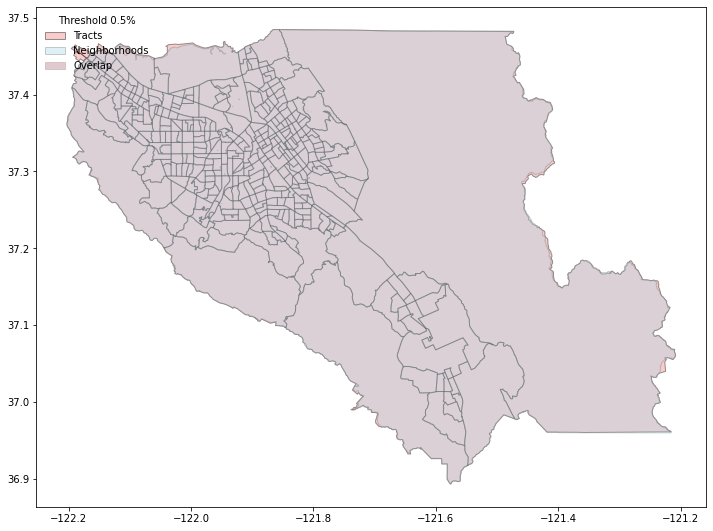

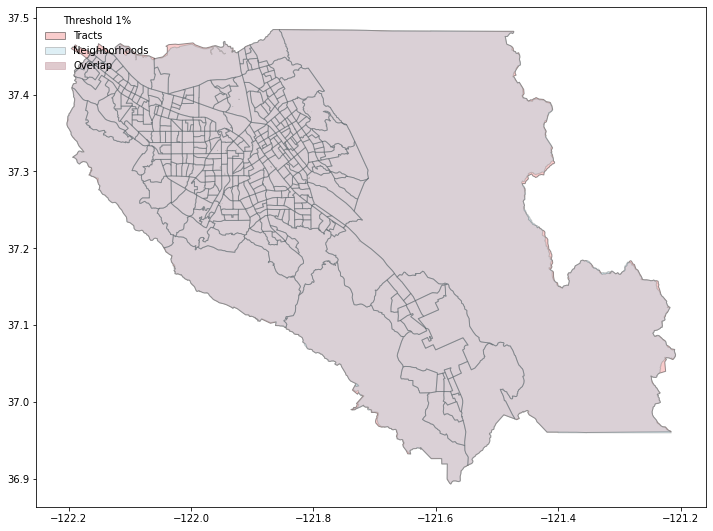

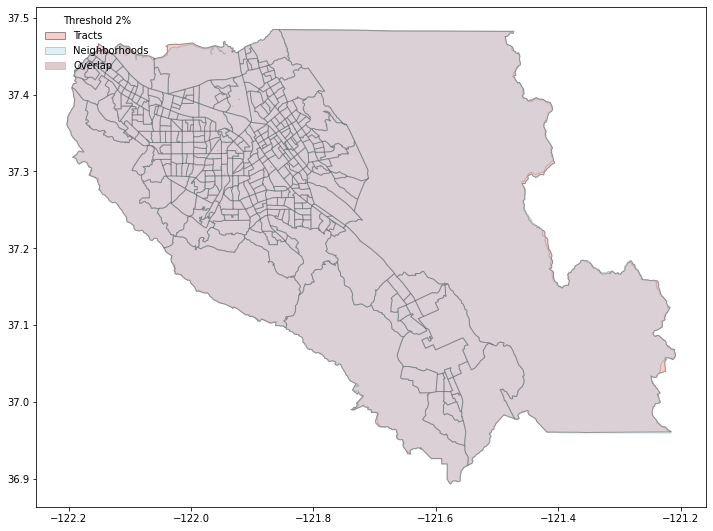

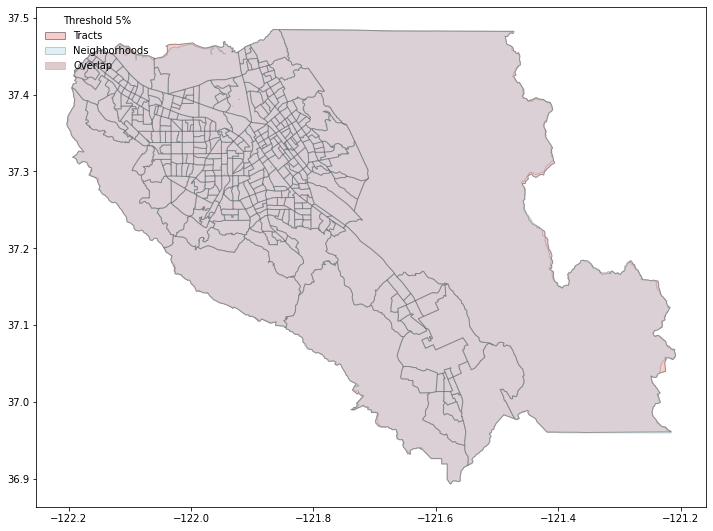

In [31]:
threshold_wrapper(city_list[14], city_results, threshold_list)

Seattle
Threshold:  0
Unique neighborhoods before: 119
       Unique tracts before: 142
          Neighborhood area: 21.6612
 Unique neighborhoods after: 119
        Unique tracts after: 142
         Total tracts after: 541
              Filtered area: 21.643
                  Area loss: 0.084
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 119
       Unique tracts before: 142
          Neighborhood area: 21.6612
 Unique neighborhoods after: 100
        Unique tracts after: 138
         Total tracts after: 411
              Filtered area: 21.6399
                  Area loss: 0.0983
                 Tract loss: 4
          Neighborhood loss: 19
Missing neighborhoods:  [  2   7   8   9  10  11  13  14  15  16  17  18  19  20  23  24  26  28
 110] 

Threshold:  0.1
Unique neighborhoods before: 119
       Unique tracts before: 142
          Neighborhood area: 21.6612
 Unique neighborhoods after: 97
   

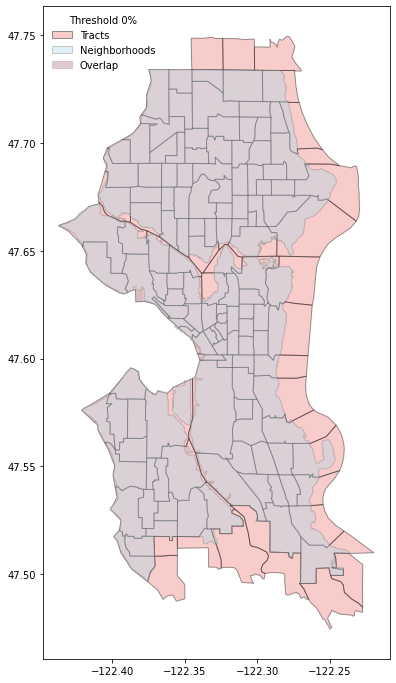

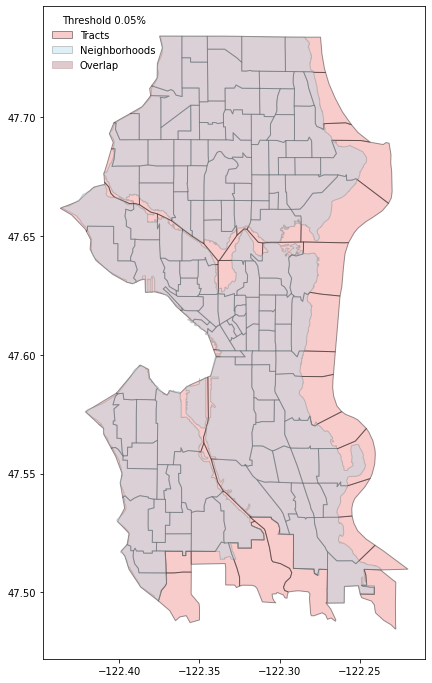

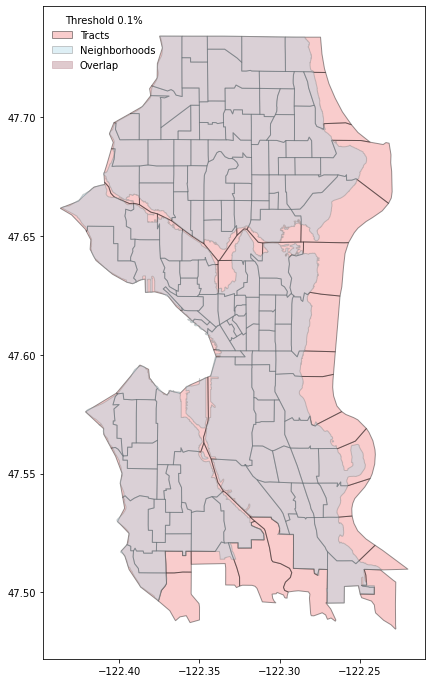

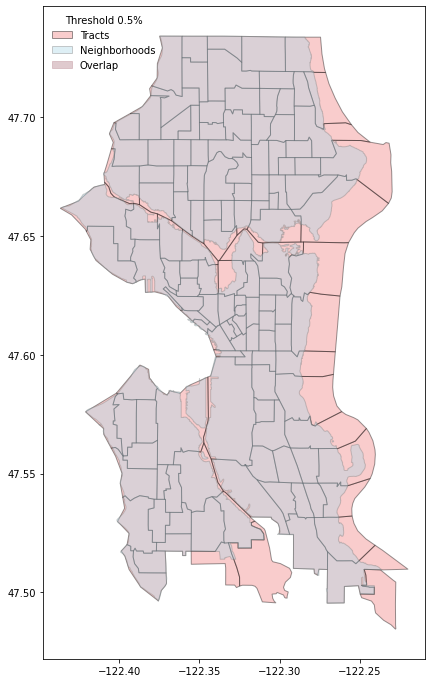

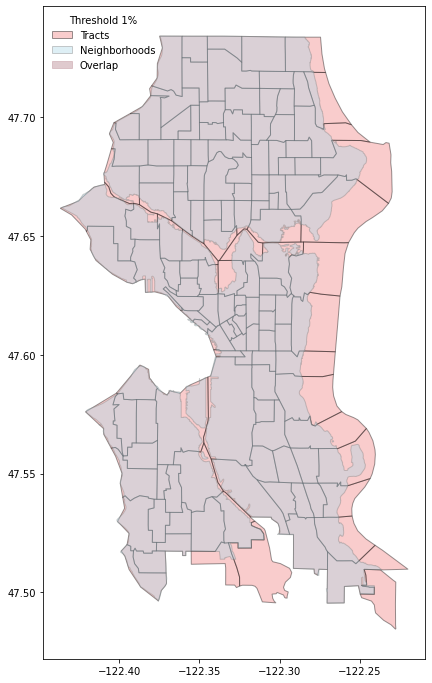

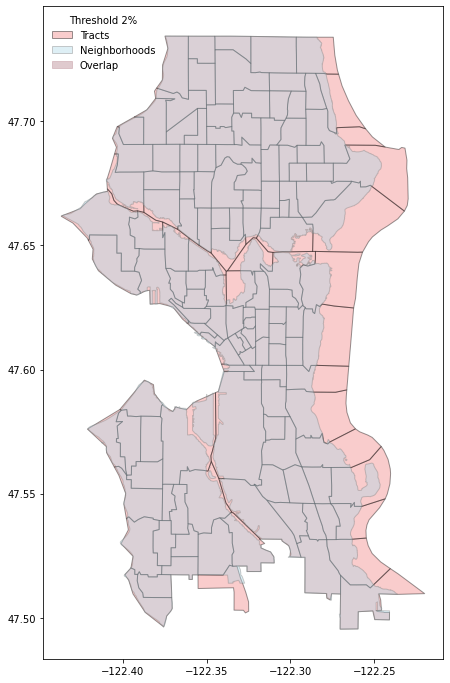

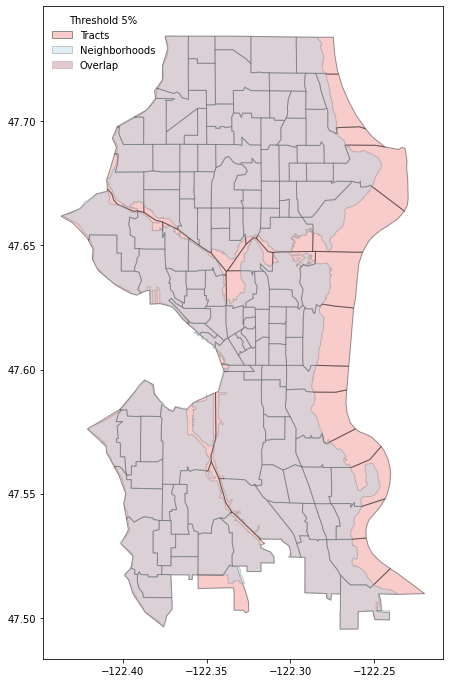

In [32]:
threshold_wrapper(city_list[15], city_results, threshold_list)

Washington DC
Threshold:  0
Unique neighborhoods before: 46
       Unique tracts before: 179
          Neighborhood area: 17.7467
 Unique neighborhoods after: 46
        Unique tracts after: 179
         Total tracts after: 453
              Filtered area: 17.6471
                  Area loss: 0.5612
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.05
Unique neighborhoods before: 46
       Unique tracts before: 179
          Neighborhood area: 17.7467
 Unique neighborhoods after: 46
        Unique tracts after: 179
         Total tracts after: 402
              Filtered area: 17.6463
                  Area loss: 0.5657
                 Tract loss: 0
          Neighborhood loss: 0
Missing neighborhoods:  [] 

Threshold:  0.1
Unique neighborhoods before: 46
       Unique tracts before: 179
          Neighborhood area: 17.7467
 Unique neighborhoods after: 46
        Unique tracts after: 179
         Total tracts after: 381
           

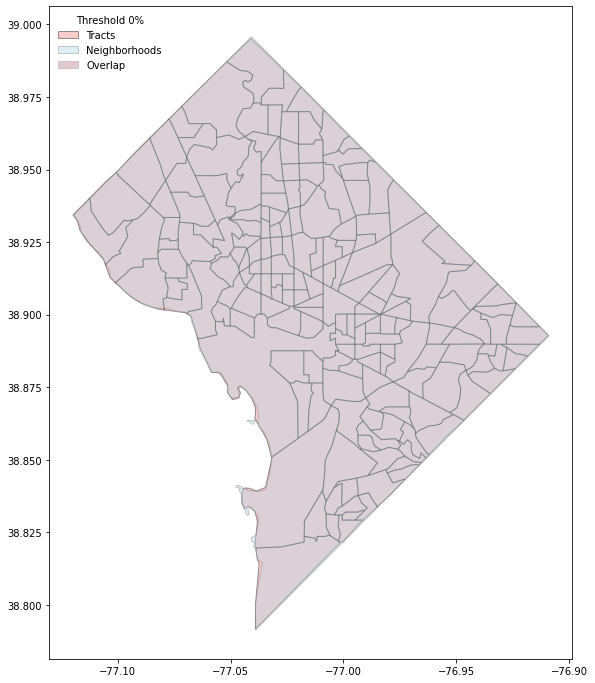

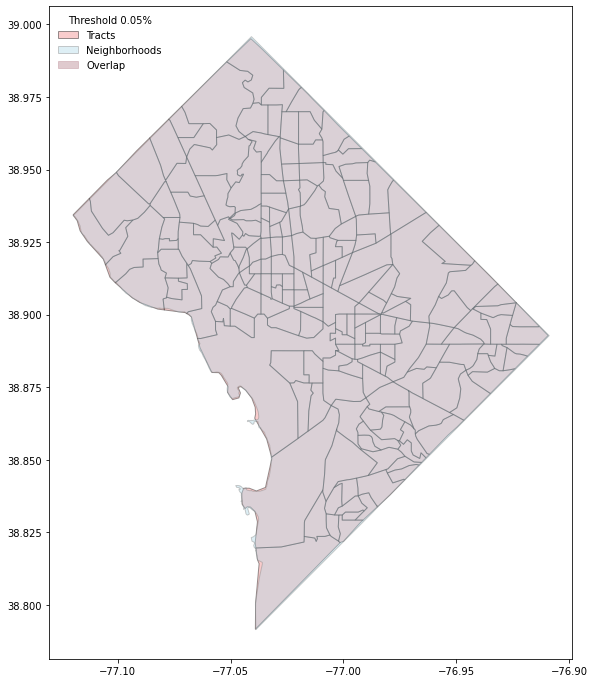

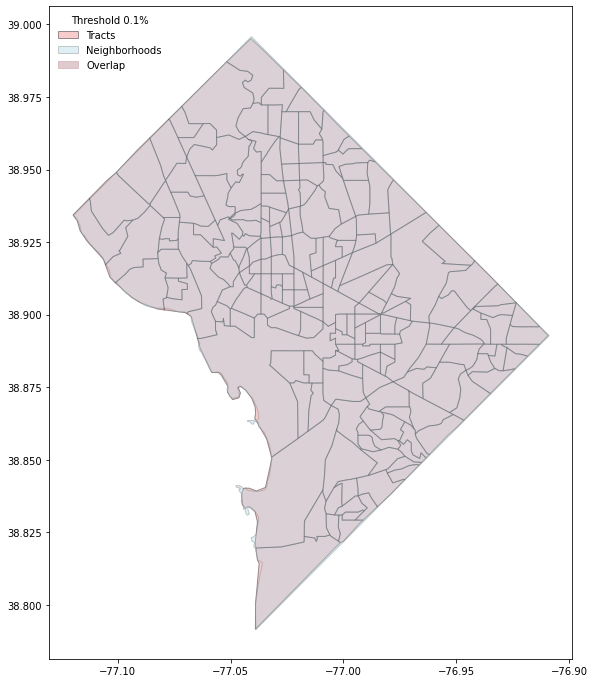

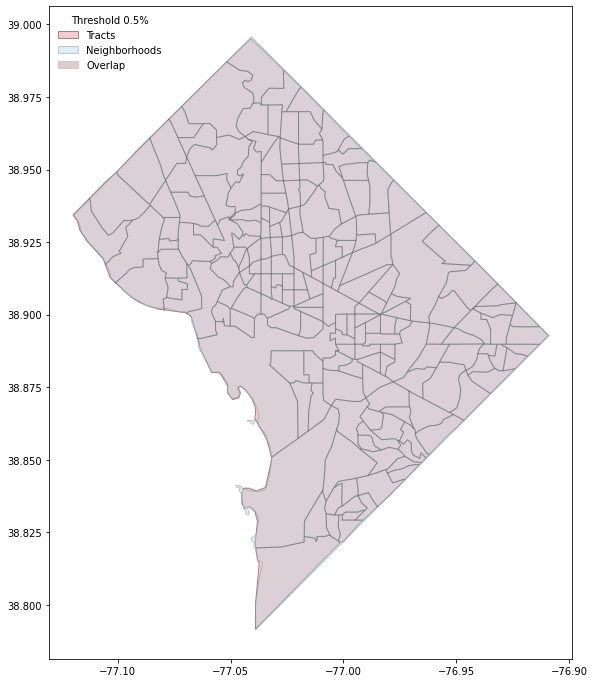

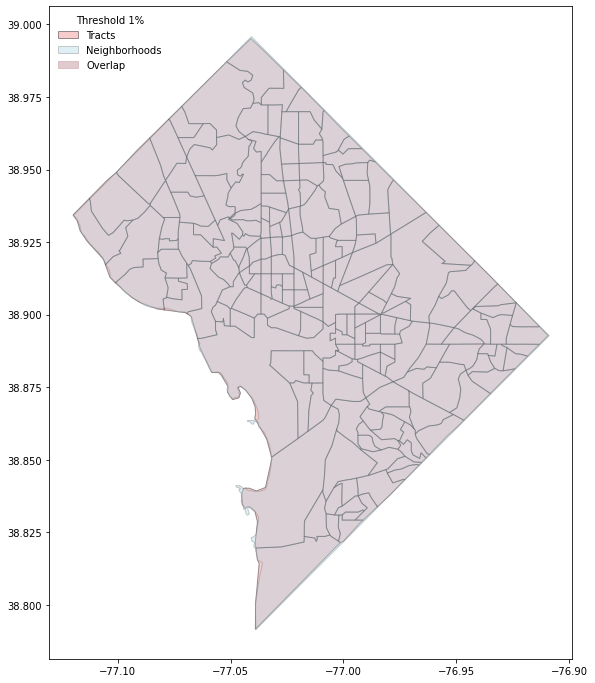

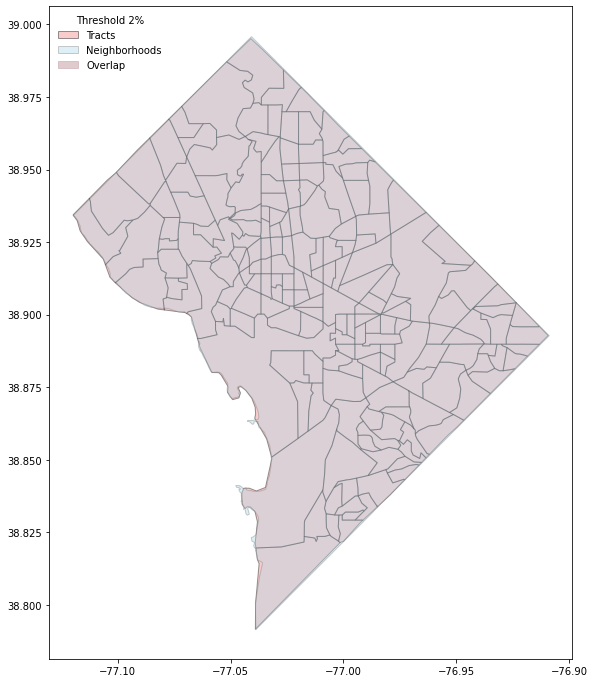

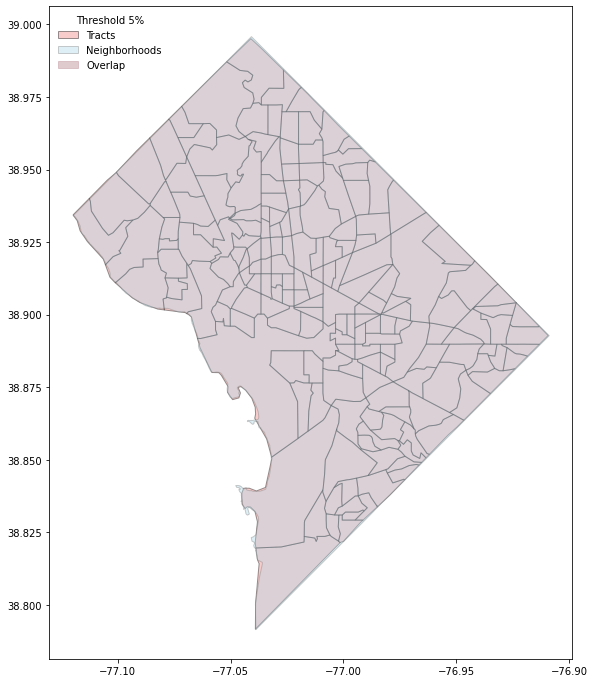

In [33]:
threshold_wrapper(city_list[16], city_results, threshold_list)

In [36]:
city_results

{'Key': ['Threshold', ('Lost Nbhd/Total', 'Lost Tract/Total', '% Area Loss')],
 'Austin': [[0, ('0/103', '0/222', 0.0)],
  [0.05, ('0/103', '2/222', 0.0168)],
  [0.1, ('0/103', '3/222', 0.035)],
  [0.5, ('0/103', '6/222', 0.3068)],
  [1, ('0/103', '8/222', 0.6086)],
  [2, ('0/103', '9/222', 1.2626)],
  [5, ('0/103', '13/222', 3.0609)]],
 'Baltimore': [[0, ('0/278', '0/231', 0.0333)],
  [0.05, ('0/278', '10/231', 0.0642)],
  [0.1, ('0/278', '14/231', 0.1036)],
  [0.5, ('0/278', '24/231', 0.3409)],
  [1, ('0/278', '28/231', 0.6061)],
  [2, ('1/278', '31/231', 1.0406)],
  [5, ('9/278', '31/231', 3.2507)]],
 'Boston': [[0, ('0/26', '0/213', 0.1373)],
  [0.05, ('0/26', '16/213', 0.1468)],
  [0.1, ('0/26', '17/213', 0.1555)],
  [0.5, ('0/26', '29/213', 0.2557)],
  [1, ('0/26', '32/213', 0.3599)],
  [2, ('0/26', '33/213', 0.4506)],
  [5, ('0/26', '33/213', 0.76)]],
 'Dallas': [[0, ('0/14', '0/383', 0.0)],
  [0.05, ('0/14', '5/383', 0.0025)],
  [0.1, ('0/14', '8/383', 0.0075)],
  [0.5, ('0/14'

In [38]:
remove_overlaps(losangeles, 'display_na', print_info=True)

    Row 1: Agua Dulce L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    6.304740566725906e-05 & 5.044481833563425e-05
    Row 2: Angeles Crest L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    2.9903942334889137e-06 & 3.2650695348402393e-05
    Row 3: Palmdale L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    4.140410362355431e-08 & 1.416862837468811e-07
    Row 4: Southeast Antelope Valley L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    1.655842241832841e-05 & 8.121088279597246e-05
    Row 5: Tujunga Canyons L.A. County Neighborhood (Current) & Acton L.A. County Neighborhood (Current)
    2.006702688870726e-07 & 1.1712234404161342e-06
    Row 6: Acton L.A. County Neighborhood (Current) & Agua Dulce L.A. County Neighborhood (Current)
    5.0444818335634255e-05 & 6.304740566725907e-05
    Row 8: Palmdale L.A. County Neighborhood (Current) & Agua Dulce L.A. Co

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -118.085710676454 34.419890137153253 (-118.08571067645399921 34.419890137153252851)
<A>
GEOMETRYCOLLECTION (LINESTRING (-117.8898459999999915 34.1651209991226494, -117.8898520000002037 34.1614899991226721), LINESTRING (-118.1178719243801112 34.4806809849069253, -118.1178660269384295 34.4807119909937754), POLYGON ((-118.0795859088922413 34.4701407283688042, -118.0449262930528391 34.4703381370782083, -118.0111199299880695 34.4701377083992355, -118.0111063607413655 34.4427025729470344, -118.0105330000000095 34.4431629991194157, -118.0097650000000016 34.4433069991194571, -118.0085169999999977 34.4410989991194540, -118.0074290000000019 34.4404429991195045, -118.0071410000000043 34.4396429991194495, -118.0064210000000031 34.4390669991194542, -118.0049970000000030 34.4386029991194818, -118.0046450000000107 34.4382509991194894, -118.0043409999999966 34.4383309991195858, -118.0034930000000060 34.438074999119

    Row 24: Acton L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    1.416862837474264e-07 & 4.1404103623713665e-08
    Row 25: Agua Dulce L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    3.1683619152656858e-21 & 7.407978334390726e-22
    Row 26: Castaic Canyons L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    3.122372369073641e-24 & 4.473659218174421e-24
    Row 27: Desert View Highlands L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    0.00010686123432894766 & 3.511343256652573e-07
Overlap in Desert View Highlands L.A. County Neighborhood (Current) and Palmdale L.A. County Neighborhood (Current): larger than 0.01%
    Row 28: Lancaster L.A. County Neighborhood (Current) & Palmdale L.A. County Neighborhood (Current)
    1.9288517912917105e-06 & 1.4708879544480483e-06
    Row 29: Leona Valley L.A. County Neighborhood (Current) & Palmdale L.A. Coun

    Row 71: Exposition Park L.A. County Neighborhood (Current) & Jefferson Park L.A. County Neighborhood (Current)
    0.0006569215168797598 & 0.0008573287082975916
Overlap in Exposition Park L.A. County Neighborhood (Current) and Jefferson Park L.A. County Neighborhood (Current): larger than 0.01%
    Row 73: West Adams L.A. County Neighborhood (Current) & Jefferson Park L.A. County Neighborhood (Current)
    5.335392212245576e-05 & 5.5728064501435015e-05
    Row 74: Koreatown L.A. County Neighborhood (Current) & Pico-Union L.A. County Neighborhood (Current)
    0.00027785849685565793 & 0.00044992111169014904
Overlap in Koreatown L.A. County Neighborhood (Current) and Pico-Union L.A. County Neighborhood (Current): larger than 0.01%
    Row 75: Downtown L.A. County Neighborhood (Current) & Pico-Union L.A. County Neighborhood (Current)
    0.00011361825873207074 & 0.0003968597542567632
Overlap in Downtown L.A. County Neighborhood (Current) and Pico-Union L.A. County Neighborhood (Curren

    Row 119: Alhambra L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    9.486781872442379e-05 & 9.452679920636665e-05
    Row 120: East Los Angeles L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    4.86166156618519e-13 & 4.738160125023223e-13
    Row 121: El Sereno L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    4.305594396561522e-05 & 2.3431686032038692e-05
    Row 123: San Gabriel L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    1.1851531900426882e-05 & 6.445921920444833e-06
    Row 124: South San Gabriel L.A. County Neighborhood (Current) & Monterey Park L.A. County Neighborhood (Current)
    2.692040525853616e-12 & 4.981791776486747e-13
    Row 125: Alhambra L.A. County Neighborhood (Current) & San Gabriel L.A. County Neighborhood (Current)
    6.493694933578493e-05 & 0.00011896449590846583
Overlap in Alhambra L.A. County

    Row 166: Alondra Park L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.0011243818470909935 & 6.225755550466424e-05
Overlap in Alondra Park L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%
    Row 167: Gardena L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.000576630187426656 & 0.00016379676187137018
Overlap in Gardena L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%
    Row 168: Harbor City L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    4.8052915518755364e-05 & 6.013645106426848e-06
    Row 169: Harbor Gateway L.A. County Neighborhood (Current) & Torrance L.A. County Neighborhood (Current)
    0.00018582609382517877 & 4.646897085768905e-05
Overlap in Harbor Gateway L.A. County Neighborhood (Current) and Torrance L.A. County Neighborhood (Current): larger than 0.01%

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -118.16566404327224 34.208053233742092 (-118.16566404327224404 34.208053233742091948)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.0942547553516135 34.1352155807105646, -118.0942879808104351 34.1352159996708053), LINESTRING (-118.1102276038138541 34.1373069991229983, -118.1101610000003177 34.1368079991230289), POLYGON ((-118.1869149999999848 34.2375079991217532, -118.1867170000000016 34.2343049991218535, -118.1864029999999985 34.2335659991217653, -118.1868410000001006 34.2321519991218750, -118.1866640000001496 34.2230209991220562, -118.1834820000001116 34.2231079991219431, -118.1834340000000196 34.2224039991219584, -118.1776740000001240 34.2224519991220362, -118.1775503100035536 34.2200896197547095, -118.1775749783614771 34.2200910027032421, -118.1773049792892749 34.2154040005952425, -118.1773049792892039 34.2154040005952353, -118.1773049792892039 34.2154040005951927, -118.1744019855798342 34.2150880037

    Row 187: Arcadia L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    3.864672335644704e-05 & 1.7133932938349177e-05
    Row 188: Eagle Rock L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.1080044325904742e-05 & 1.8727133932192709e-06
    Row 189: East Pasadena L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.119520864063414e-11 & 5.814958225375624e-13
    Row 190: Glendale L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    1.1168482933517408e-06 & 1.3597321149934867e-06
    Row 191: Highland Park L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    8.738554891758152e-05 & 1.1851817908640281e-05
    Row 192: La Canada Flintridge L.A. County Neighborhood (Current) & Pasadena L.A. County Neighborhood (Current)
    2.527654296684525e-05 & 8.659334456497797e-06
    Row 194: San Marino L.A. County Neighborhood (Cur

CBR: result (after common-bits addition) is INVALID: Self-intersection at or near point -117.77585910072403 34.148028109457272 (-117.77585910072403408 34.148028109457271739)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.1178719243801112 34.4806809849069253, -118.1178660269384295 34.4807119909937754), POLYGON ((-118.0795859088922413 34.4701407283688042, -118.0449262930528391 34.4703381370782083, -118.0111199299880695 34.4701377083992355, -118.0111063607413655 34.4427025729470344, -118.0105330000000095 34.4431629991194157, -118.0097650000000016 34.4433069991194571, -118.0085169999999977 34.4410989991194540, -118.0074290000000019 34.4404429991195045, -118.0071410000000043 34.4396429991194495, -118.0064210000000031 34.4390669991194542, -118.0049970000000030 34.4386029991194818, -118.0046450000000107 34.4382509991194894, -118.0043409999999966 34.4383309991195858, -118.0034930000000060 34.4380749991195216, -118.0029490000000010 34.4376429991195465, -118.0020530000000178 34.4372589991194857, -118.

    Row 221: Pomona L.A. County Neighborhood (Current) & La Verne L.A. County Neighborhood (Current)
    1.918801086751647e-06 & 5.1256034455408e-06
    Row 222: San Dimas L.A. County Neighborhood (Current) & La Verne L.A. County Neighborhood (Current)
    1.0133487642843356e-05 & 1.846979620152077e-05
    Row 223: Angeles Crest L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    4.2570269381444323e-07 & 1.317745084270586e-05
    Row 224: Arcadia L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    2.911526162009337e-06 & 2.3306674235871286e-06
    Row 225: Bradbury L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    1.722640996721385e-06 & 2.3870703660240045e-07
    Row 226: Duarte L.A. County Neighborhood (Current) & Monrovia L.A. County Neighborhood (Current)
    0.000190171307409796 & 9.133221631928301e-05
Overlap in Duarte L.A. County Neighborhood (Current) and Monrovia L.A. County Ne

CBR: result (after common-bits addition) is INVALID: Too few points in geometry component at or near point -118.073391999202 34.147765024698543 (-118.07339199920200201 34.147765024698543357)
<A>
GEOMETRYCOLLECTION (LINESTRING (-118.1102066150306769 34.1371497498267686, -118.1101610000000051 34.1368079991230005), LINESTRING (-118.1659049718369943 34.2103040059890020, -118.1666013129370043 34.2106909333350018), LINESTRING (-118.1634449718369950 34.1997130059749992, -118.1620869876220041 34.1992767755600013), POLYGON ((-118.1869149999999991 34.2375079991220019, -118.1867170000000016 34.2343049991220028, -118.1864029999999985 34.2335659991219998, -118.1868410000000011 34.2321519991220029, -118.1866639999999933 34.2230209991219994, -118.1834819999999979 34.2231079991220000, -118.1834340000000054 34.2224039991220010, -118.1776739999999961 34.2224519991220006, -118.1775503100039941 34.2200896197550009, -118.1775749783609939 34.2200910027030005, -118.1773049792890049 34.2154040005950009, -118.

    Row 258: East Pasadena L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    0.00047073649011073387 & 0.0002815197030233871
Overlap in East Pasadena L.A. County Neighborhood (Current) and East San Gabriel L.A. County Neighborhood (Current): larger than 0.01%
    Row 260: Rosemead L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    3.6631123686086894e-05 & 8.636699815506336e-05
    Row 261: San Gabriel L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    7.246032279248695e-05 & 0.00013801711328145452
Overlap in San Gabriel L.A. County Neighborhood (Current) and East San Gabriel L.A. County Neighborhood (Current): larger than 0.01%
    Row 262: San Marino L.A. County Neighborhood (Current) & East San Gabriel L.A. County Neighborhood (Current)
    0.0003438493899373903 & 0.000595642034779476
Overlap in San Marino L.A. County Neighborhood (Current) and East San Gabrie

    Row 308: Mission Hills L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    1.9977875513150417e-05 & 8.912254558715399e-06
    Row 310: San Fernando L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    9.428028490798779e-07 & 3.15257502484082e-07
    Row 311: Sylmar L.A. County Neighborhood (Current) & Pacoima L.A. County Neighborhood (Current)
    3.3167000843726414e-06 & 5.797978839739589e-06
    Row 313: Sun Valley L.A. County Neighborhood (Current) & Panorama City L.A. County Neighborhood (Current)
    2.347097906811022e-06 & 6.069722588505333e-06
    Row 314: Burbank L.A. County Neighborhood (Current) & Sun Valley L.A. County Neighborhood (Current)
    5.2891148630128406e-05 & 9.732891790406476e-05
    Row 315: North Hollywood L.A. County Neighborhood (Current) & Sun Valley L.A. County Neighborhood (Current)
    3.109512503427289e-05 & 1.936401280625345e-05
    Row 316: Panorama City L.A. County Neighborhood (Curren

    Row 359: Harbor Gateway L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    0.0003391487597876481 & 0.0010608900989469926
Overlap in Harbor Gateway L.A. County Neighborhood (Current) and Vermont Vista L.A. County Neighborhood (Current): larger than 0.01%
    Row 360: Vermont Knolls L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    6.316220643141776e-07 & 4.4099772088494173e-07
    Row 361: Westmont L.A. County Neighborhood (Current) & Vermont Vista L.A. County Neighborhood (Current)
    0.0010016592133884233 & 0.0011268281049680543
Overlap in Westmont L.A. County Neighborhood (Current) and Vermont Vista L.A. County Neighborhood (Current): larger than 0.01%
    Row 362: Athens L.A. County Neighborhood (Current) & Harbor Gateway L.A. County Neighborhood (Current)
    0.00040659953145552076 & 0.000105559808078517
Overlap in Athens L.A. County Neighborhood (Current) and Harbor Gateway L.A. County Neighborhood

    Row 401: Eagle Rock L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    6.325960084338993e-05 & 8.78207407038791e-06
    Row 402: Glassell Park L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.9390731118989546e-05 & 2.6417427437477257e-06
    Row 404: Griffith Park L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.2034058195338125e-05 & 4.198164884816114e-06
    Row 405: La Crescenta-Montrose L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    2.1674506704892166e-06 & 2.4263411020723935e-07
    Row 406: Pasadena L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    1.3597321149934867e-06 & 1.1168482933517408e-06
    Row 407: Shadow Hills L.A. County Neighborhood (Current) & Glendale L.A. County Neighborhood (Current)
    1.535273068911999e-05 & 6.4276465583174804e-06
    Row 408: Tujunga Canyons L.A. County Neigh

    Row 456: Azusa L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    4.0842190722417066e-05 & 0.0003988033923440399
Overlap in Azusa L.A. County Neighborhood (Current) and Citrus L.A. County Neighborhood (Current): larger than 0.01%
    Row 458: Covina L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    7.999972326897032e-14 & 6.004826357787716e-13
    Row 459: Glendora L.A. County Neighborhood (Current) & Citrus L.A. County Neighborhood (Current)
    7.094309959581793e-06 & 0.00013700911377445785
Overlap in Glendora L.A. County Neighborhood (Current) and Citrus L.A. County Neighborhood (Current): larger than 0.01%
    Row 460: Azusa L.A. County Neighborhood (Current) & Vincent L.A. County Neighborhood (Current)
    6.522569133727409e-07 & 4.3610066382102725e-06
    Row 461: Covina L.A. County Neighborhood (Current) & Vincent L.A. County Neighborhood (Current)
    1.5723514965393927e-07 & 8.081274315590115e-07
    Row 462:

    Row 496: Vermont Vista L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    4.409977208849417e-07 & 6.316220643141776e-07
    Row 497: Gramercy Park L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    2.2331472779690346e-06 & 2.2158672805785232e-06
    Row 498: Manchester Square L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    8.041846743775865e-05 & 7.07244532336119e-05
    Row 500: Westmont L.A. County Neighborhood (Current) & Vermont Knolls L.A. County Neighborhood (Current)
    0.000965140822967588 & 0.0015550677459753024
Overlap in Westmont L.A. County Neighborhood (Current) and Vermont Knolls L.A. County Neighborhood (Current): larger than 0.01%
    Row 502: Culver City L.A. County Neighborhood (Current) & Baldwin Hills/Crenshaw L.A. County Neighborhood (Current)
    1.705583317206205e-06 & 3.069675004568385e-06
    Row 503: Ladera Heights L.A. County Neighbo

    Row 543: Ramona L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    2.6415471424275825e-12 & 5.922742040714482e-13
    Row 544: South San Jose Hills L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    5.885839575807774e-12 & 5.416004373390427e-13
    Row 545: Valinda L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    5.88121496233567e-06 & 7.309383491895729e-07
    Row 546: Vincent L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    3.1194659900853756e-12 & 2.862067877046932e-13
    Row 547: Walnut L.A. County Neighborhood (Current) & West Covina L.A. County Neighborhood (Current)
    0.00014826332721684313 & 8.284008112682268e-05
Overlap in Walnut L.A. County Neighborhood (Current) and West Covina L.A. County Neighborhood (Current): larger than 0.01%
    Row 549: West Puente Valley L.A. County Neighborhood (Current) & West Covina L.A. Cou

Input geom 0 is INVALID: Self-intersection at or near point -118.16418000000017 33.827684999126781 (-118.1641800000001723 33.827684999126780951)
<A>
MULTIPOLYGON (((-118.1641800000001723 33.8276849991267810, -118.1610660000002042 33.8275769991267836, -118.1577880000000107 33.8250399991267443, -118.1557940000001423 33.8250319991268142, -118.1559960000002576 33.8275639991267525, -118.1541030000001484 33.8275519991267117, -118.1542010000001710 33.8288159991267747, -118.1520480000002209 33.8287549991268435, -118.1507030000002203 33.8294819991267062, -118.1495010000001429 33.8323759991266968, -118.1425440000000151 33.8323539991267239, -118.1424850000001072 33.8466939991265221, -118.1337880000001519 33.8466669991264695, -118.1321180000002187 33.8465169991266066, -118.1322990000002733 33.8470779991265616, -118.1250750000001801 33.8470549991265557, -118.1251450000001739 33.8322759991267219, -118.0974080000001720 33.8321839991267339, -118.0944410000001596 33.8318489991266134, -118.0933380000001

    Row 587: Lakewood L.A. County Neighborhood (Current) & Bellflower L.A. County Neighborhood (Current)
    9.271647498338921e-05 & 0.000142446939509722
Overlap in Lakewood L.A. County Neighborhood (Current) and Bellflower L.A. County Neighborhood (Current): larger than 0.01%
    Row 588: Long Beach L.A. County Neighborhood (Current) & Bellflower L.A. County Neighborhood (Current)
    4.108291765384234e-06 & 3.464841312039782e-05


9988229159, -118.1922990231073811 33.7596139943778297, -118.1925099975610323 33.7597749873523938, -118.1941079843625744 33.7595840054904883, -118.1958830108240477 33.7597899817960183, -118.1974500091087776 33.7603309918471766, -118.1994679981704337 33.7613209934158860, -118.1989179914529586 33.7623269890579039, -118.1989259884895063 33.7632470165559795, -118.2006740249524910 33.7632770054434133, -118.2008190238536542 33.7631729913548781, -118.2006639760445523 33.7620739775499104, -118.2000559908117339 33.7615720056646111, -118.2005159782545860 33.7617369971573780, -118.2015240257678528 33.7617619878968611, -118.2023319895289575 33.7613910200984932, -118.2024190099144931 33.7611869904400166, -118.2024420013947008 33.7604070163073189, -118.2016339850217008 33.7593769769433010, -118.2018100250519836 33.7591879943406568, -118.2016539776133754 33.7589660239618112, -118.2011879923927467 33.7591540069349278, -118.1978900039602536 33.7571740037973740, -118.1978480195178349 33.7560819873994689,

TopologicalError: The operation 'GEOSDifference_r' could not be performed. Likely cause is invalidity of the geometry <shapely.geometry.multipolygon.MultiPolygon object at 0x7fe575c9d400>

In [41]:
austin_overlay = city_list[0][0].overlay(city_list[0][0])
filtered_austin_overlay = austin_overlay[austin_overlay['neighname_1'] != austin_overlay['neighname_2']]
filtered_austin_overlay

,fid_1,target_fid_1,neighname_1,sqmiles_1,shape_leng_1,shape_area_1,shape_le_2_1,fid_2,target_fid_2,neighname_2,sqmiles_2,shape_leng_2,shape_area_2,shape_le_2_2,geometry
4,69.0,69.0,ROBINSON RANCH,10.777298,139682.703937,3.004538e+08,139682.703937,48.0,48.0,MCNEIL,7.087357,89033.685935,1.975842e+08,89033.685935,"MULTIPOLYGON (((-97.72852 30.43270, -97.72830 ..."
45,6.0,6.0,BARTON HILLS,3.188974,48357.389794,8.890350e+07,48357.389794,76.0,76.0,SOUTH LAMAR,1.213967,24988.697161,3.384344e+07,24988.697161,"POLYGON ((-97.79505 30.23473, -97.79391 30.235..."
49,94.0,94.0,WINDSOR HILLS,1.244682,24789.653502,3.469975e+07,24789.653502,84.0,84.0,TECH RIDGE,6.812974,128967.182537,1.899348e+08,128967.182537,"POLYGON ((-97.67356 30.37605, -97.67171 30.375..."
53,84.0,84.0,TECH RIDGE,6.812974,128967.182537,1.899348e+08,128967.182537,94.0,94.0,WINDSOR HILLS,1.244682,24789.653502,3.469975e+07,24789.653502,"POLYGON ((-97.67356 30.37605, -97.67171 30.375..."
66,14.0,14.0,VILLAGE AT WESTERN OAKS,2.820512,52746.580979,7.863136e+07,52746.580979,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,"MULTIPOLYGON (((-97.87770 30.19691, -97.87757 ..."
67,75.0,75.0,SOUTH BRODIE,4.801036,134565.923260,1.338452e+08,134565.923260,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,"MULTIPOLYGON (((-97.87593 30.18678, -97.87604 ..."
69,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,14.0,14.0,VILLAGE AT WESTERN OAKS,2.820512,52746.580979,7.863136e+07,52746.580979,"MULTIPOLYGON (((-97.87757 30.19701, -97.87770 ..."
71,15.0,15.0,CIRCLE C SOUTH,5.414375,78361.599967,1.509441e+08,78361.599967,75.0,75.0,SOUTH BRODIE,4.801036,134565.923260,1.338452e+08,134565.923260,"MULTIPOLYGON (((-97.87604 30.18709, -97.87593 ..."
74,76.0,76.0,SOUTH LAMAR,1.213967,24988.697161,3.384344e+07,24988.697161,6.0,6.0,BARTON HILLS,3.188974,48357.389794,8.890350e+07,48357.389794,"POLYGON ((-97.79505 30.23473, -97.79391 30.235..."
92,48.0,48.0,MCNEIL,7.087357,89033.685935,1.975842e+08,89033.685935,69.0,69.0,ROBINSON RANCH,10.777298,139682.703937,3.004538e+08,139682.703937,"MULTIPOLYGON (((-97.72830 30.43258, -97.72852 ..."


Threshold:  0.01
Unique neighborhoods before: 119
       Unique tracts before: 142
          Neighborhood area: 21.6612
 Unique neighborhoods after: 108
        Unique tracts after: 140
         Total tracts after: 460
              Filtered area: 21.6424
                  Area loss: 0.0868
                 Tract loss: 2
          Neighborhood loss: 11
Missing neighborhoods:  [  2   7  10  11  13  14  18  19  20  28 110] 



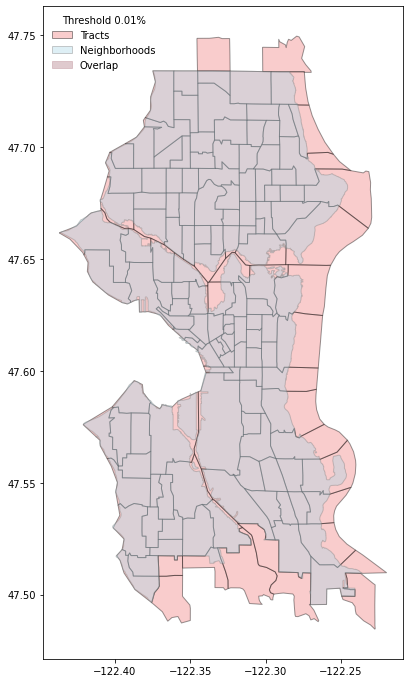

In [45]:
temp = thresholds(city_list[15][0], city_list[15][2], [.01], state=city_list[15][3])